# <center>Data Preparation Techniques (Non-ML & ML)</center>
## <center>Two parts: 1 & 2</center>
<center>(Iteration 2 will come after the iteration 1)</center>

## <center>Topic: Air Quality Dataset</center>
### <center>Author: Ali Mir</center>
______________________________________________________________________________

# About Dataset

## Context
Urban atmospheric pollutants are responsible for increasing the incidence of respiratory diseases in citizens, and some of them (e.g. benzene) are known to induce cancer in the case of
prolonged exposure.

In a case study, an Air Quality Chemical Multisensor Device was deployed on the field in an Italian city to measure the air quality over the passage of time. The output data is the responses of a gas multisensor device. The dataset can be downloaded from here: https://archive.ics.uci.edu/ml/datasets/Air+Quality.

## Content

The dataset contains 9357 rows of hourly averaged responses from an array of 5 metal oxide chemical sensors embedded in an Air Quality Chemical Multisensor Device. The device was located on the field in a highly polluted area, at road level, within an Italian city. Data was recorded from March 2004 to February 2005 (one year), representing the longest freely available recordings of on-field deployed air quality chemical sensor device responses. Ground Truth hourly averaged concentrations for CO, Non Methanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2) are provided by a co-located reference certified analyzer. Missing values are labeled with "**-200**".

## Attributes

* Date: (DD/MM/YYYY)


* Time: (HH.MM.SS)


* CO(GT):	True hourly averaged CO concentration [**mg/m^3**] (reference analyzer)


* PT08.S1(CO):	PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)


* NMHC(GT):	Non Metanic HydroCarbons concentration [**μg/m^3**] (reference analyzer)


* C6H6(GT):	True hourly averaged Benzene concentration [**μg/m^3**] (reference analyzer)


* PT08.S2(NMHC):	PT08.S2 (titania) hourly averaged sensor response (nominally NMHC targeted)


* NOx (GT):	True hourly averaged NOx concentration [**ppb**] (reference analyzer)


* PT08.S3(NOx):	PT08.S3 (tungsten oxide) hourly averaged sensor response


* NO2(GT):	True hourly averaged NO2 concentration [**μg/m^3**] (reference analyzer)


* PT08.S4(NO2):	PT08.S4 (tungsten oxide) hourly averaged sensor response


* PT08.S5(O3):	PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted)


* T:	Temperature [**°C**]


* RH:	Relative Humidity (%)
* AH:   Absolute Humidity
------------------------------------------------------------------------------------

First, we import the necessary libraries and load our data from a .csv file.

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings; warnings.filterwarnings('ignore')

# construct a python pandas dataframe from a csv file
df = pd.read_csv("AirQuality.csv", sep=";", decimal=',')
#we make the panda interpret semicolon as separation and comma as the decimal parameter
df.info()
df.head(10)

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9471 entries, 0 to 9470

Data columns (total 17 columns):

 #   Column         Non-Null Count  Dtype  

---  ------         --------------  -----  

 0   Date           9357 non-null   object 

 1   Time           9357 non-null   object 

 2   CO(GT)         9357 non-null   float64

 3   PT08.S1(CO)    9357 non-null   float64

 4   NMHC(GT)       9357 non-null   float64

 5   C6H6(GT)       9357 non-null   float64

 6   PT08.S2(NMHC)  9357 non-null   float64

 7   NOx(GT)        9357 non-null   float64

 8   PT08.S3(NOx)   9357 non-null   float64

 9   NO2(GT)        9357 non-null   float64

 10  PT08.S4(NO2)   9357 non-null   float64

 11  PT08.S5(O3)    9357 non-null   float64

 12  T              9357 non-null   float64

 13  RH             9357 non-null   float64

 14  AH             9357 non-null   float64

 15  Unnamed: 15    0 non-null      float64

 16  Unnamed: 16    0 non-null      float64

dtypes: float64(15), object(2)

mem

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN
5,10/03/2004,23.00.00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848,NaN,NaN
6,11/03/2004,00.00.00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603,NaN,NaN
7,11/03/2004,01.00.00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702,NaN,NaN
8,11/03/2004,02.00.00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648,NaN,NaN
9,11/03/2004,03.00.00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517,NaN,NaN


From the exhibition above, we can find out that our raw imported database has 17 columns, 9471 entries, and the last 2 columns are fully NaN and extraly imported. So, in the next step, we do some simple haircut and cleaning to make our dataframe more usable.
______________________________________________________________________________

# Initial Data Cleaning

In [2]:
#Dropping the last 2 columns (extra & all-nan) 
df.drop(['Unnamed: 15','Unnamed: 16'], axis = 1, inplace = True)

In [3]:
#Dropping extra fully empty rows
df.drop(df.index[9357:9471], inplace = True)

In [4]:
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10.00.00,3.1,1314.0,-200.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11.00.00,2.4,1163.0,-200.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12.00.00,2.4,1142.0,-200.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13.00.00,2.1,1003.0,-200.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


______________________________________________________________________________
In our dataframe, the NaN data are tagged with "-200". We now replace those values with NaN.

In [5]:
#Converting "-200" data to "NaN"

df.replace(-200, np.nan, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 15 columns):

 #   Column         Non-Null Count  Dtype  

---  ------         --------------  -----  

 0   Date           9357 non-null   object 

 1   Time           9357 non-null   object 

 2   CO(GT)         7674 non-null   float64

 3   PT08.S1(CO)    8991 non-null   float64

 4   NMHC(GT)       914 non-null    float64

 5   C6H6(GT)       8991 non-null   float64

 6   PT08.S2(NMHC)  8991 non-null   float64

 7   NOx(GT)        7718 non-null   float64

 8   PT08.S3(NOx)   8991 non-null   float64

 9   NO2(GT)        7715 non-null   float64

 10  PT08.S4(NO2)   8991 non-null   float64

 11  PT08.S5(O3)    8991 non-null   float64

 12  T              8991 non-null   float64

 13  RH             8991 non-null   float64

 14  AH             8991 non-null   float64

dtypes: float64(13), object(2)

memory usage: 1.1+ MB


______________________________________________________________________________
Now, we should change our dates and times formatting into a readable format that pandas can understands.
Our dates are in "dd/mm/yyyy" format and will be converted to "yyyy-mm-dd" format.
The times will be also changed from "hh.mm.ss" to "hh:mm:ss".

In [6]:
#Formatting our dates and times to datetime type

df['Date'] = pd.to_datetime(df['Date'], dayfirst=True) #parses dates with the day first
df['Time'] = pd.to_datetime(df['Time'], format= '%H.%M.%S').dt.time

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 15 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   NMHC(GT)       914 non-null    float64       

 5   C6H6(GT)       8991 non-null   float64       

 6   PT08.S2(NMHC)  8991 non-null   float64       

 7   NOx(GT)        7718 non-null   float64       

 8   PT08.S3(NOx)   8991 non-null   float64       

 9   NO2(GT)        7715 non-null   float64       

 10  PT08.S4(NO2)   8991 non-null   float64       

 11  PT08.S5(O3)    8991 non-null   float64       

 12  T              8991 non-null   float64       

 13  RH             8991 non-null   float64       

 14  AH             8991 non-null   float64       

dtypes

______________________________________________________________________________
Now, we calculate the NaN percentage of each of the columns to decide which columns should be removed.

In [8]:
def NaN_Percentages(dataframe, columns):
    print(f'No. of Rows = {dataframe.shape[0]}')
    print("NaN Ratios:\n")
    for c in dataframe.columns:
        NaN_percent= 100*dataframe[c].isna().sum()/len(dataframe[c])
        print(f'{c}: %{np.round(NaN_percent, 2)}')
        
NaN_Percentages(df, columns=df.columns)

No. of Rows = 9357

NaN Ratios:



Date: %0.0

Time: %0.0

CO(GT): %17.99

PT08.S1(CO): %3.91

NMHC(GT): %90.23

C6H6(GT): %3.91

PT08.S2(NMHC): %3.91

NOx(GT): %17.52

PT08.S3(NOx): %3.91

NO2(GT): %17.55

PT08.S4(NO2): %3.91

PT08.S5(O3): %3.91

T: %3.91

RH: %3.91

AH: %3.91


______________________________________________________________________________
As it can be seen from the info above, the column "NMHC(GT)" has **%90.23** missing values; so we will drop that attribute because keeping that will not be that helpful for our analysis as predicting and filling the missing data wouldn't work 'cause there is a huge number of missing values which the low remaining data cannot properly help fill the NaNs. 

In [9]:
#Dropping NMHC(GT) column as it contains a high percentage of null values.

df.drop('NMHC(GT)', axis=1, inplace=True) 

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   C6H6(GT)       8991 non-null   float64       

 5   PT08.S2(NMHC)  8991 non-null   float64       

 6   NOx(GT)        7718 non-null   float64       

 7   PT08.S3(NOx)   8991 non-null   float64       

 8   NO2(GT)        7715 non-null   float64       

 9   PT08.S4(NO2)   8991 non-null   float64       

 10  PT08.S5(O3)    8991 non-null   float64       

 11  T              8991 non-null   float64       

 12  RH             8991 non-null   float64       

 13  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

--------------------------------------------------------------------------------------
So until this point, we have 14 columns, including dates and times, and the total number of instances are 9357. Our measurements have been recorded hourly through consecutive days. In the next step, we want to have a general visualization of the behavior of our data, how the series are distributed to assess the centrality and spread tendencies.

# Visualized Data Distribution Assessment

Some concepts about different distributions:

* A *normal distribution* is symmetrical, and its mean (average), median (midpoint), and mode (most frequent observation) are all the same. In this distribution, most data fall within 3 standard deviation of the mean value. [[reference](https://www.investopedia.com/terms/n/normaldistribution.asp)]
* *Multimodal distribution* has multi peaks.
* A *skewed distribution* is neither symmetric nor normal because the data values trail off more sharply on one side than on the other. [[reference](https://www.sciencedirect.com/topics/mathematics/skewed-distribution)] The longer tail in an asymmetrical distribution pulls the mean away from the most common values. [[reference](https://statisticsbyjim.com/basics/skewed-distribution/)]
![alternatvie text](https://www.biologyforlife.com/uploads/2/2/3/9/22392738/c101b0da6ea1a0dab31f80d9963b0368_orig.png)

______________________________________________________________________________
Histograms are a good choice for almost all data types to assess the distributions. When combined with probability density plots, histograms can help us recognize the type of our distribution. Density plot is a smoothed version of the histogram and is used in the same concept.

In the following, we have defined a function so it can automatically plot both the histogram and probability density function for each of our column values on the same plot.

In [11]:

def plot_histograms_density(df, columns):
    fig, axs = plt.subplots(len(columns), 1, figsize=(20,50))
    i = 0
    for c in columns:
        df[c].hist(ax=axs[i], density=True, label="normalized histogram plot") # normalizes the density
        df[c].plot.density(ax=axs[i], label="probability density plot")
        axs[i].set(title=f"{c} probabilities VS. {c} values")
        axs[i].legend(loc="upper right")
        i+=1


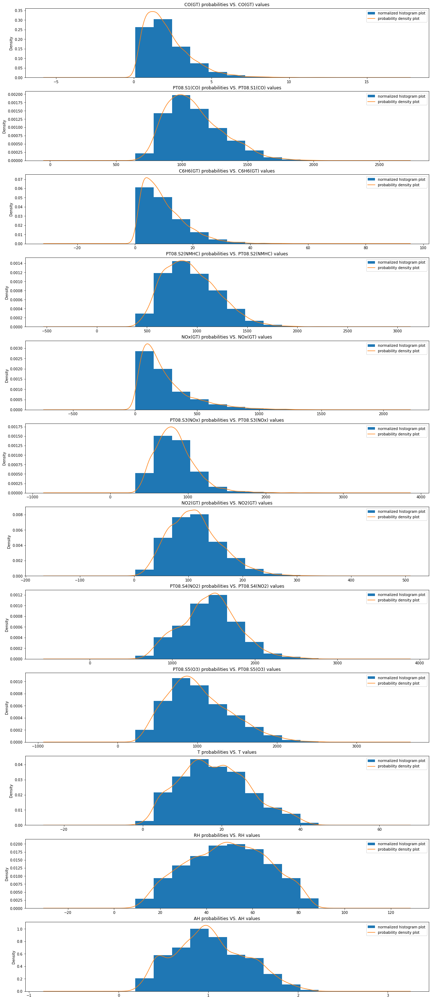

In [12]:
plot_histograms_density(df, df.columns[2:])

______________________________________________________________________________
In continuation, we also plot our box plots to see the distribution of data from another point. In descriptive statistics, box plots visually show the distribution of numerical data and can nicely help say the skewness through displaying the data quartiles (or percentiles) and averages. They show the five-number summary of a dataset: including the minimum score, first (lower) quartile, median, third (upper) quartile, and maximum score. [[reference](https://www.simplypsychology.org/boxplots.html)] They also show outliers within a dataset.
![alternatvie text](https://www.simplypsychology.org/bloxplots-skewed.jpg)

In [13]:
def my_boxplot(df, columns):
    fig, axs = plt.subplots(len(columns), 1, figsize=(20, 50))
    axs = axs.flatten()
    i=0
    for c in columns:
        df.boxplot(c, ax=axs[i], vert=False) #c = df.columns[i]: column name
        axs[i].set_title(f'Boxplot of the "{c}" data')
        i+=1
    plt.show()


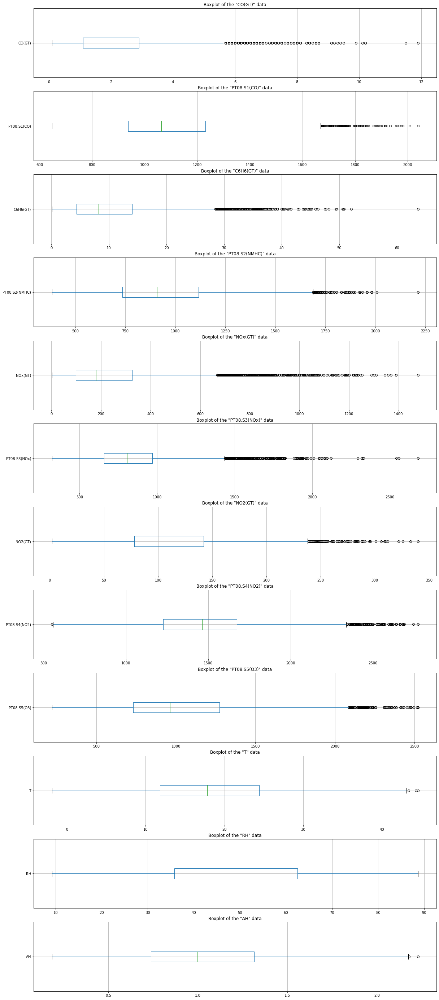

In [14]:
my_boxplot(df, df.columns[2:])

______________________________________________________________________________
From all the figures, plots, and explanations above, we can conclude the following results concerning our time series:
<!-- * CO(GT): right skewed, some outliers
* PT08.S1(CO): right skewed, many outliers
* C6H6(GT): right skewed, many outliers
* PT08.S2(NMHC): almost many outliers
* NOx(GT): right skewed, so many outliers
* PT08.S3(NOx): many outliers
* NO2(GT): some outliers
* PT08.S4(NO2): some many outliers
* PT08.S5(O3): right skewed, some many outliers
* T: multimidal distribution: no/very few outliers
* RH: no outliers
* AH: multimidal distribution, no/very few outliers -->

| Column | Skewness | Outliers |
| :- | :- | :- |
| CO(GT) | right skewed | some outliers |
| PT08.S1(CO) | right skewed |  many outliers |
| C6H6(GT) | right skewed | many outliers |
| PT08.S2(NMHC) |  | almost many outliers|
| NOx(GT) | right skewed| so many outliers |
| PT08.S3(NOx) | | many outliers|
| NO2(GT) |  | some outliers|
| PT08.S4(NO2) |  | some many outliers|
| PT08.S5(O3) | right skewed| some many outliers |
| T | multimodal distribution| no/very few outliers |
| RH |  | no outliers |
| AH | multimodal distribution | no/very few outliers|

______________________________________________________________________________
As specified above, many of our columns have skewness. So it would be better to use a median whenever we want to replace some values with a central value.

To dig deeper into descriptive statistics and justify our findings and also discuss ever more, we can step into numerical point of view in the next part.

# Descriptive Statistics


We here use **".describe()"** to calculate the centrality and spread measurements:


In [15]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,7674.000000,8991.000000,8991.000000,8991.000000,7718.000000,8991.000000,7715.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,2.152750,1099.833166,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530
std,1.453252,217.080037,7.449820,266.831429,212.979168,256.817320,48.370108,346.206794,398.484288,8.832116,17.316892,0.403813
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700
25%,1.100000,937.000000,4.400000,734.500000,98.000000,658.000000,78.000000,1227.000000,731.500000,11.800000,35.800000,0.736800
50%,1.800000,1063.000000,8.200000,909.000000,180.000000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400
75%,2.900000,1231.000000,14.000000,1116.000000,326.000000,969.500000,142.000000,1674.000000,1273.500000,24.400000,62.500000,1.313700
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


In [16]:
stats = ['mean', 'median', 'min', 'max', 'std', 'var', 'skew']

agg_dict = {}
keys = df.columns[2:]
values = stats
for i in keys:
    agg_dict[i] = values

desc_stats = df.agg(agg_dict)
desc_stats

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
mean,2.152750,1099.833166,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530
median,1.800000,1063.000000,8.200000,909.000000,180.000000,806.000000,109.000000,1463.000000,963.000000,17.800000,49.600000,0.995400
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000
std,1.453252,217.080037,7.449820,266.831429,212.979168,256.817320,48.370108,346.206794,398.484288,8.832116,17.316892,0.403813
var,2.111941,47123.742575,55.499814,71199.011290,45360.126046,65955.135860,2339.667327,119859.143884,158789.727561,78.006268,299.874765,0.163065
skew,1.369753,0.755907,1.361532,0.561566,1.715781,1.101729,0.621714,0.205389,0.627864,0.309357,-0.037928,0.251388


From the above tables, the skewness amount of the column values is defined. Also, it is clear that there is high spread mainly for "PT08.S1(CO)", "PT08.S2(NMHC)", "NOx(GT)", "PT08.S3(NOx)", "PT08.S4(NO2)", and "PT08.S5(O3)". Means and medians are also different in many of the columns. So we should use a median whenever we want to replace some values with a central value.

______________________________________________________________________________
# Time Series Illustration
Each index in our dataframe relates to a specific hour of a day which the measurement has been recorded. So the indexes are practically representatives of our dates and time, and instead of time, we use the indexes on the horizontal axis. Surely, we have many missing values in our dataframe. To grab how much and at which places an/several attribute(s) is/are not measured, we can use the **plot** function to have a line plot and see the blanks (gaps/missed values) through the time series.

Note: the attribute values have their own specific units mentioned at the introductory part.

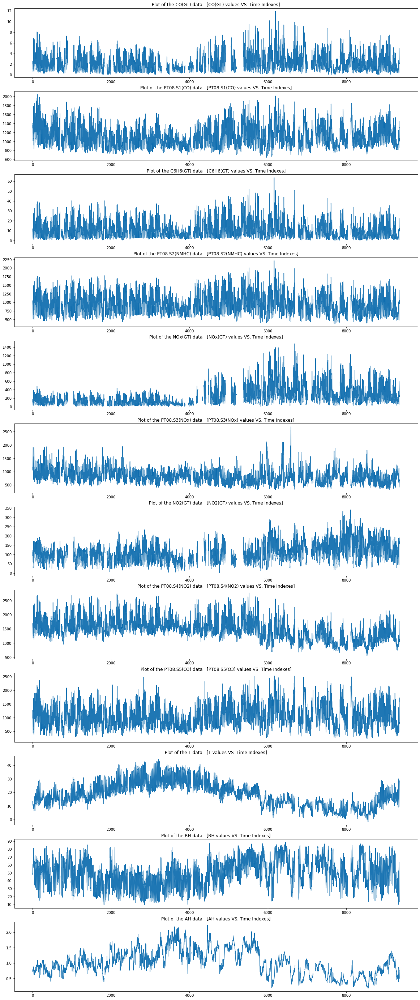

In [17]:
# we define a function to automatically plot each attribute time series.
def my_plot(df, columns):
    fig, axs = plt.subplots(len(columns), 1, figsize=(20, 50))
    axs = axs.flatten()
    i=0
    for c in columns:
        df[c].plot(ax=axs[i])
        axs[i].set(title=f'Plot of the {c} data   [{c} values VS. Time Indexes]')
        i+=1
    plt.show()

my_plot(df, df.columns[2:])

______________________________________________________________________________
# Dropping Rows

Until this point, we should have a good insight of how our data are. First, we create a function to plot two dataframes together:
the original one and the modified dataframe resulted from the methods we are applying to it.

Note: the attribute values have their own specific units mentioned at the introductory part.

In [18]:
def plot_orig_modif_series(original, modified, columns):
    fig, axs = plt.subplots(len(columns), 1, figsize=(22,30))
    axs = axs.flatten()
    x_range = (original.index.min(), original.index.max())
    i = 0
    for c in columns:
        # because our data is large, and is measured hourly,
        # we use every n_th row to visualize our data less densely.
        original[c][::5].plot(ax=axs[i], title=c, xlim=x_range, label='Original', linewidth=3, color='black', alpha=1)
        modified[c][::5].plot(ax=axs[i], title=c, xlim=x_range, label='Modified', linewidth=3, color='red', alpha=0.6)
        axs[i].legend(loc='upper right')
        axs[i].set(title=f'{c} values VS. Indexes')
        
        i+=1

______________________________________________________________________________
To show that all the rows and columns have no issues and to drop all NaN-containing-rows, with any number of NaN data, we can use **.dropna()**, which will result in a dataframe with all-through non-Nan data.

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 6941 entries, 0 to 6940

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           6941 non-null   datetime64[ns]

 1   Time           6941 non-null   object        

 2   CO(GT)         6941 non-null   float64       

 3   PT08.S1(CO)    6941 non-null   float64       

 4   C6H6(GT)       6941 non-null   float64       

 5   PT08.S2(NMHC)  6941 non-null   float64       

 6   NOx(GT)        6941 non-null   float64       

 7   PT08.S3(NOx)   6941 non-null   float64       

 8   NO2(GT)        6941 non-null   float64       

 9   PT08.S4(NO2)   6941 non-null   float64       

 10  PT08.S5(O3)    6941 non-null   float64       

 11  T              6941 non-null   float64       

 12  RH             6941 non-null   float64       

 13  AH             6941 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

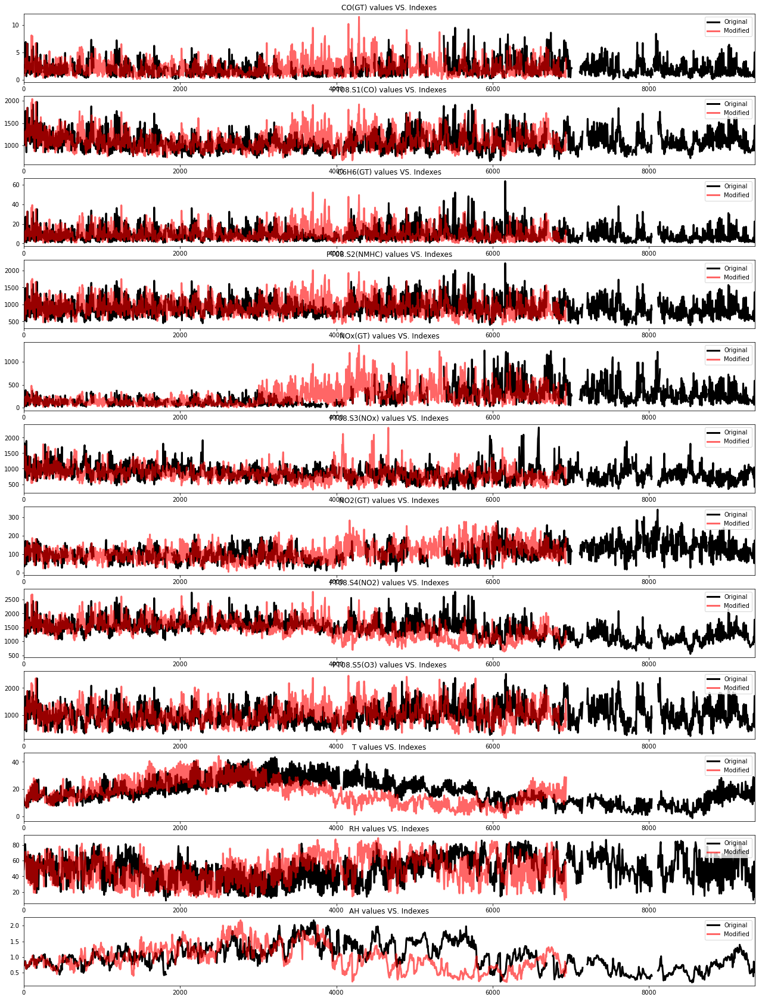

In [19]:
drop_df = df.copy() # we make a copy to avoid losing original information
drop_df = drop_df.dropna()
drop_df.reset_index(drop=True, inplace=True)
drop_df.info()
plot_orig_modif_series(df, drop_df, drop_df.columns[2:])

In [20]:
NaN_Percentages(drop_df, columns=drop_df.columns)

No. of Rows = 6941

NaN Ratios:



Date: %0.0

Time: %0.0

CO(GT): %0.0

PT08.S1(CO): %0.0

C6H6(GT): %0.0

PT08.S2(NMHC): %0.0

NOx(GT): %0.0

PT08.S3(NOx): %0.0

NO2(GT): %0.0

PT08.S4(NO2): %0.0

PT08.S5(O3): %0.0

T: %0.0

RH: %0.0

AH: %0.0


______________________________________________________________________________
As you can see above, all the NaN data has been removed. It seems that at the end parts of the series, there is a huge removal. It is because as long as there would be even one NaN value, with the **.dropna()**, the whole row would be removed!
So we can use a threshold by **dropna(thresh=3)** and say if there would be a specified number of NaNs in a row, that row should be deleted. Let's try it:

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9326 entries, 0 to 9325

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9326 non-null   datetime64[ns]

 1   Time           9326 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   C6H6(GT)       8991 non-null   float64       

 5   PT08.S2(NMHC)  8991 non-null   float64       

 6   NOx(GT)        7718 non-null   float64       

 7   PT08.S3(NOx)   8991 non-null   float64       

 8   NO2(GT)        7715 non-null   float64       

 9   PT08.S4(NO2)   8991 non-null   float64       

 10  PT08.S5(O3)    8991 non-null   float64       

 11  T              8991 non-null   float64       

 12  RH             8991 non-null   float64       

 13  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

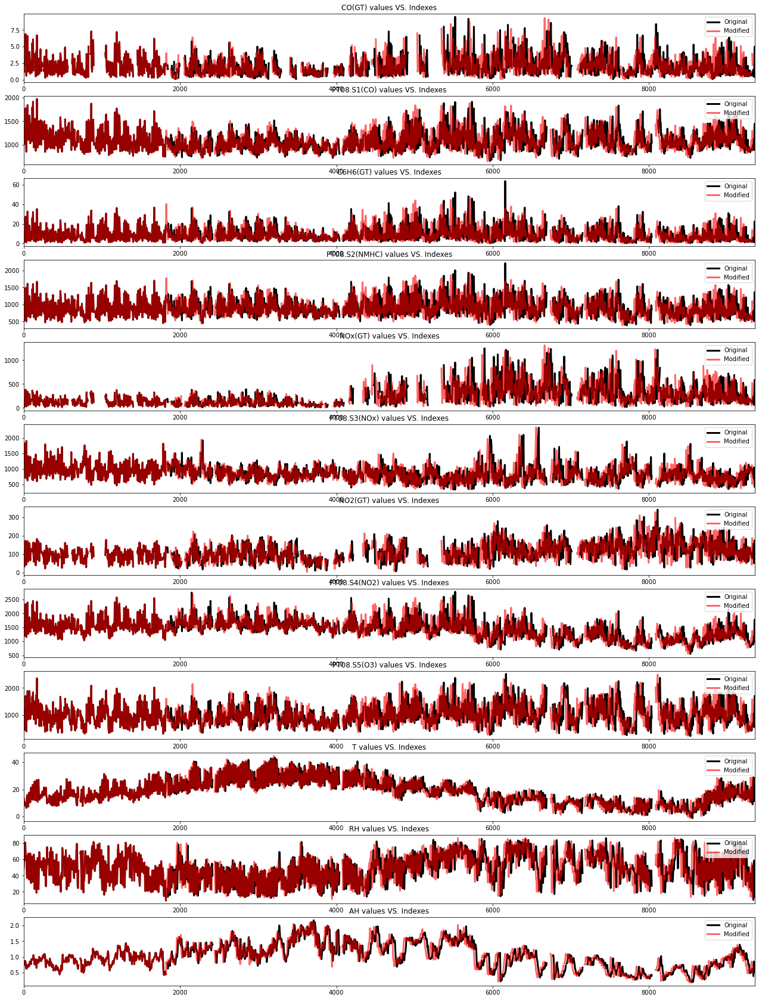

In [21]:
drop_df = df.copy()
drop_df = drop_df.dropna(thresh=3) # drops if only 3 column vals are missing
drop_df.reset_index(drop=True, inplace=True)
drop_df.info()
plot_orig_modif_series(df, drop_df, drop_df.columns[2:])

We now can see the NaN percentages after applying a threshold dropping:

In [22]:
NaN_Percentages(drop_df, columns=drop_df.columns) # shows the NaN Ratios

No. of Rows = 9326

NaN Ratios:



Date: %0.0

Time: %0.0

CO(GT): %17.71

PT08.S1(CO): %3.59

C6H6(GT): %3.59

PT08.S2(NMHC): %3.59

NOx(GT): %17.24

PT08.S3(NOx): %3.59

NO2(GT): %17.27

PT08.S4(NO2): %3.59

PT08.S5(O3): %3.59

T: %3.59

RH: %3.59

AH: %3.59


As we can see, there isn't a huge removal because we used a threshold to decide if we remove a row or not. The total number of remained rows is 9326 compared with the previous method that was 6941.

<!-- We can also take another approach, and first, delete the columns with a hight ratio of NaN values (*CO(GT)*: %17.71, *NOx(GT)*: %17.24, *NO2(GT)*: %17.27), and then decide to use dropping rows -->

______________________________________________________________________________
# Filling in Missed Values

## Fill Using a Constant

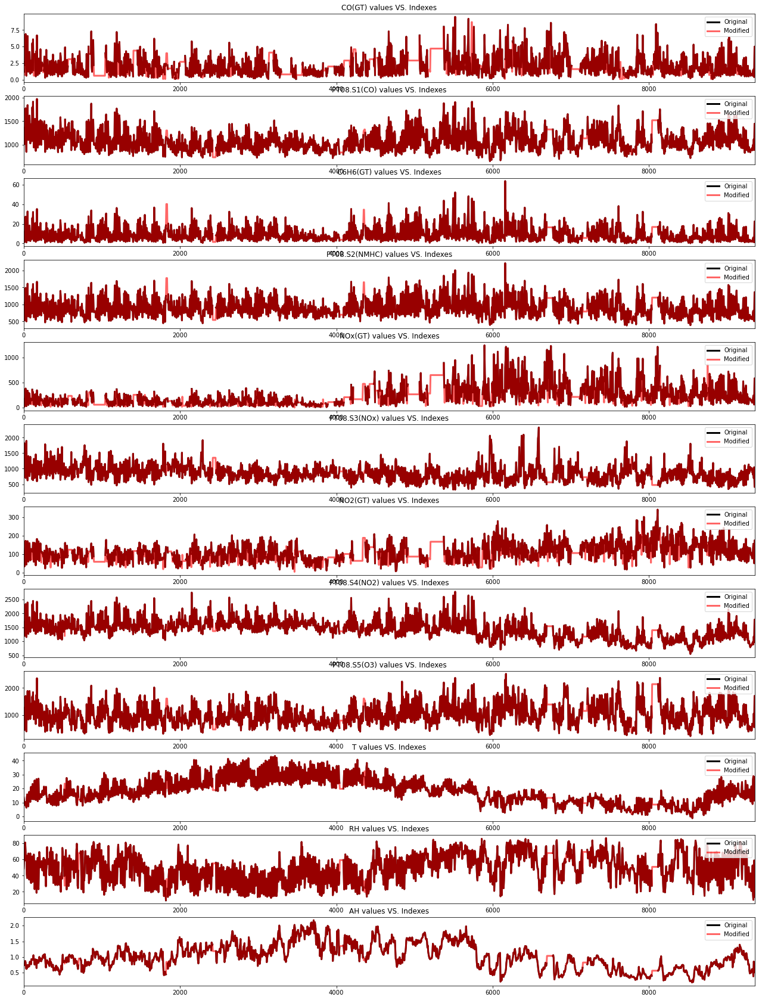

In [23]:

fill_df = df.copy()
# fill_df = fill_df.fillna(0) #fill NaN values with a constant

# Forward filling and backward filling are two approaches to fill missing values.
# Forward filling means fill missing values with previous data.
# Backward filling means fill missing values with next data point.
fill_df = fill_df.fillna(method='bfill') #Backward fill
# fill_df = fill_df.fillna(method='ffill') #Forward fill
plot_orig_modif_series(df, fill_df, fill_df.columns[2:])


______________________________________________________________________________
## Fill Using a Centrality Measurement

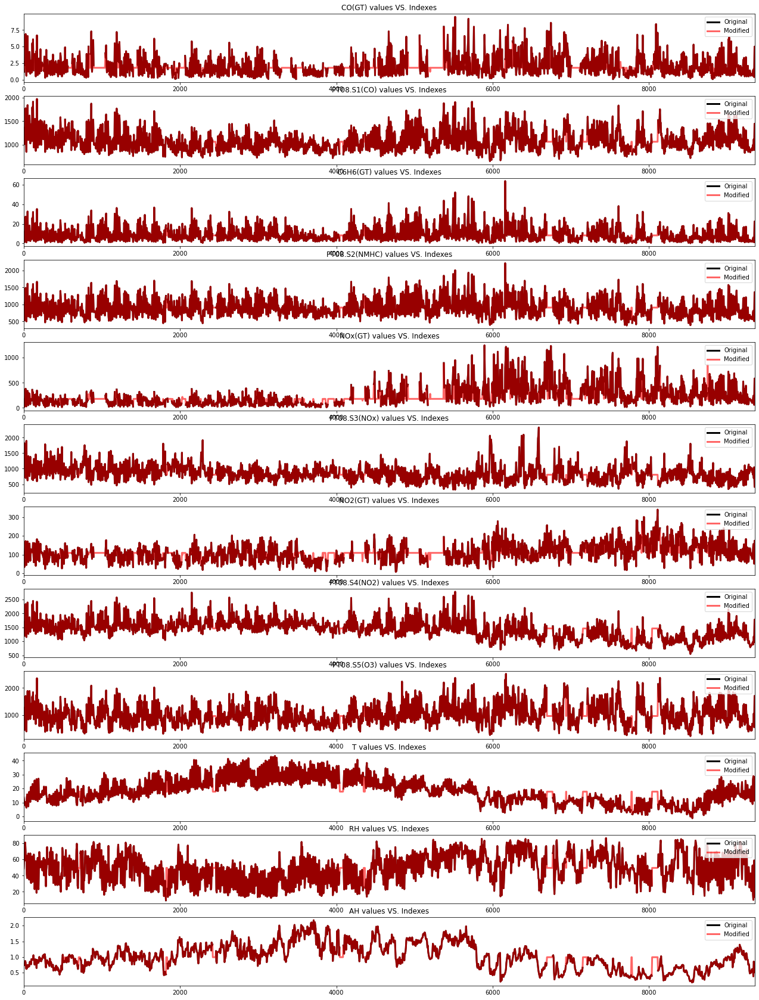

In [24]:
fill_agg_df = df.copy()
def fill_by_aggregate(df, method, columns):
    for c in columns:
        
        Measure = None
        if    method == 'median':
            Measure = df[c].median()
        elif  method == 'mean':
            Measure = df[c].mean()
        else:
            Measure = df[c].mode()[0]
        df[c].fillna(Measure, inplace=True) 

# we try filling in by median or mode, not mean, as our data are mostly skewed.
fill_by_aggregate(fill_agg_df, 'median', fill_agg_df.columns[2:])
# fill_by_aggregate(fill_agg_df, 'mode', fill_agg_df.columns[2:])

plot_orig_modif_series(df, fill_agg_df, fill_agg_df.columns[2:])

______________________________________________________________________________
## Fill Using Interpolation Techniques

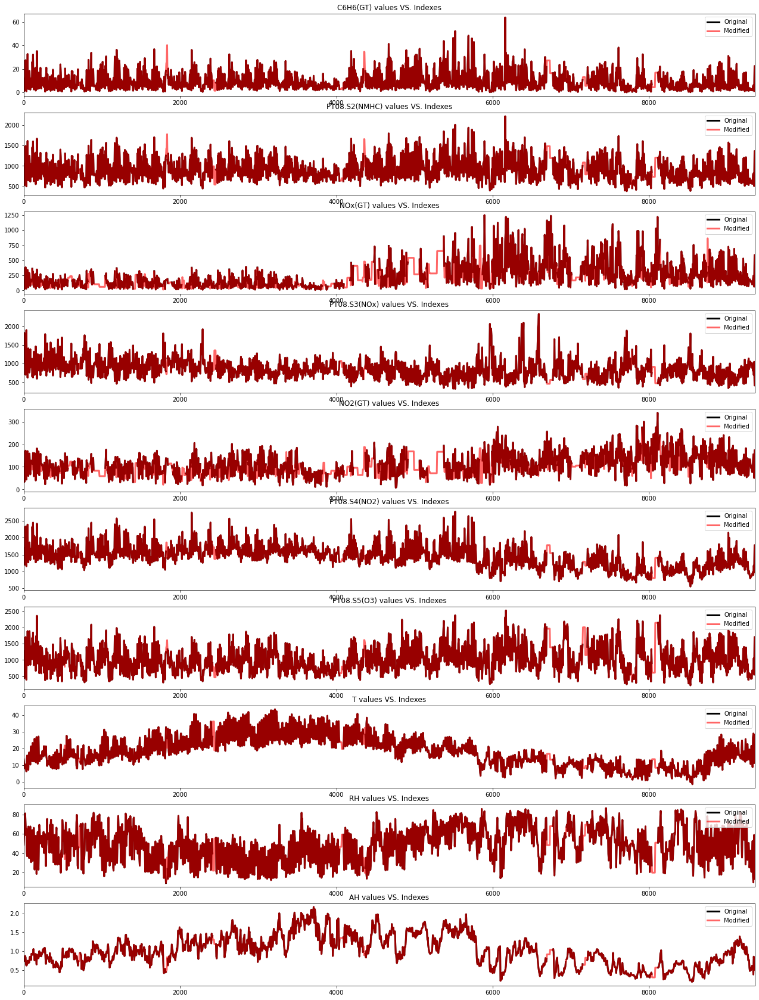

In [25]:
interpol_df = df.copy()
interpol_df = interpol_df[interpol_df.columns[2:]] # because the first two columns are dates.
# interpol_df = interpol_df.interpolate(method='polynomial', order=3)
interpol_df = interpol_df.interpolate(method='nearest')
plot_orig_modif_series(df, interpol_df, interpol_df.columns[2:])

______________________________________________________________________________
# Removing Outliers

## Interquartile Range Method

Removing outliers using IQR method is so useful as you can see easily your outliers on the boxplots and see their positions clearly. This method is prefered to Standard Deviation for removing outliers because in Interquartile Range Method we have the specific parameters of IQR, Q1, Q3 specific for each distribution that can show the behavior of each attribute values uniquely.
In the following, we define a function to automatically calculate those Interquartile Range parameters and the lower and higher limits for each of columns, so it can remove the outliers for us.

Outliers Ratio of CO(GT) was: %2.59

Outliers Ratio of PT08.S1(CO) was: %1.26

Outliers Ratio of C6H6(GT) was: %2.46

Outliers Ratio of PT08.S2(NMHC) was: %0.69

Outliers Ratio of NOx(GT) was: %4.69

Outliers Ratio of PT08.S3(NOx) was: %2.58

Outliers Ratio of NO2(GT) was: %1.18

Outliers Ratio of PT08.S4(NO2) was: %1.04

Outliers Ratio of PT08.S5(O3) was: %0.99

Outliers Ratio of T was: %0.03

Outliers Ratio of RH was: %0.0

Outliers Ratio of AH was: %0.02





<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   C6H6(GT)       8991 non-null   float64       

 5   PT08.S2(NMHC)  8991 non-null   float64       

 6   NO

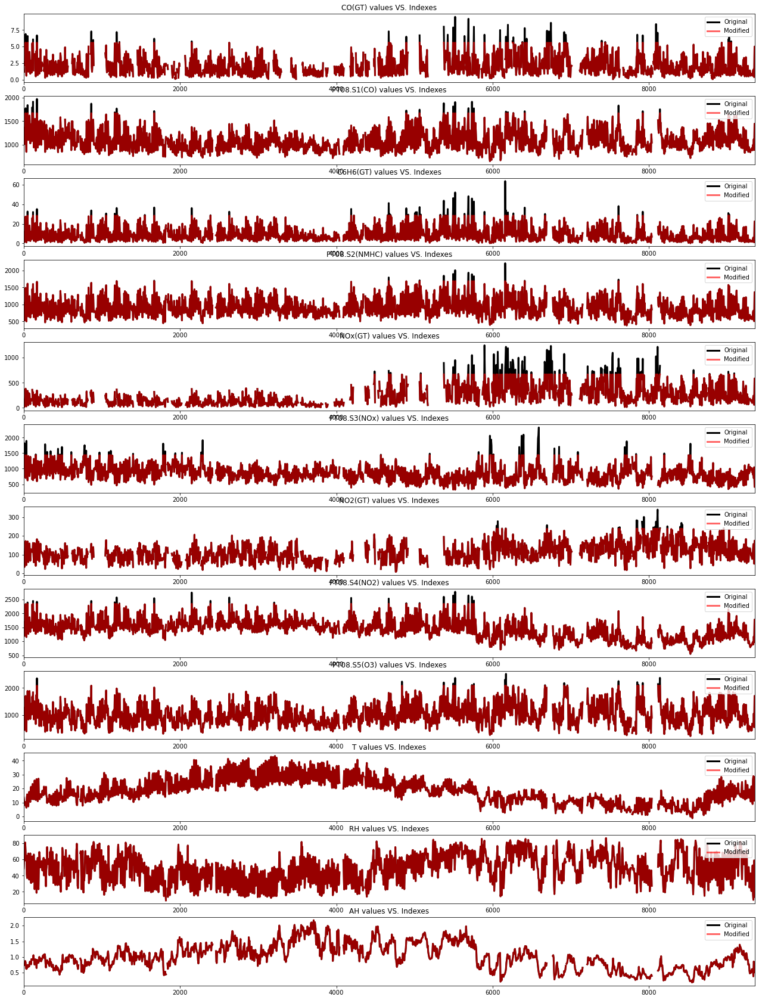

In [26]:
def remove_outliers_IQR(df, columns, scale=1.5, mode="replace"):
    outliers = pd.DataFrame()
    for c in columns:
        q1=df[c].quantile(0.25)
        q3=df[c].quantile(0.75)
        iqr = q3-q1
        low_lim = q1 - scale*iqr
        high_lim = q3 + scale*iqr
        # To show what percentage of each column are outliers
        Outs = df[c][(df[c] >= high_lim) | (df[c] <= low_lim)]
        Out_Ratio = 100*(len(Outs)/len(df[c]))
        print(f"Outliers Ratio of {c} was: %{np.round(Out_Ratio, 2)}")
#         print(f"High Limit of ({c}): {high_lim};\t Low Limit of ({c}): {low_lim}")

##      We can replace or remove the outliers based on our goal.
##      which can be defined by the keyword "mode": replace/remove
        if mode == "remove":
            indexes = df[c][(df[c] > high_lim) | (df[c] < low_lim)].index
            df.loc[indexes, c] = np.nan # replace outliers with nan
            
        else:
            df[c] = np.where(df[c] >= high_lim, high_lim, np.where(df[c] <= low_lim, low_lim, df[c])) # replace
        
        
    print("\n")
    df.info()

cdf = df.copy()        
remove_outliers_IQR(cdf, cdf.columns[2:], scale=1.5)
plot_orig_modif_series(df, cdf, df.columns[2:])

______________________________________________________________________________
### Dropping

In [27]:
# We can remove CO(GT), NOx(GT), and NO2(GT) sensor data
# as their ammount of null values is high if compared with other sensors.
# "cdf" is the dataset which its outliers got already modified by IQR method.
cdf.drop(['CO(GT)', 'NOx(GT)', 'NO2(GT)'], axis=1, inplace=True)
cdf.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 11 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   PT08.S1(CO)    8991 non-null   float64       

 3   C6H6(GT)       8991 non-null   float64       

 4   PT08.S2(NMHC)  8991 non-null   float64       

 5   PT08.S3(NOx)   8991 non-null   float64       

 6   PT08.S4(NO2)   8991 non-null   float64       

 7   PT08.S5(O3)    8991 non-null   float64       

 8   T              8991 non-null   float64       

 9   RH             8991 non-null   float64       

 10  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(9), object(1)

memory usage: 804.2+ KB


______________________________________________________________________________

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 8991 entries, 0 to 8990

Data columns (total 11 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           8991 non-null   datetime64[ns]

 1   Time           8991 non-null   object        

 2   PT08.S1(CO)    8991 non-null   float64       

 3   C6H6(GT)       8991 non-null   float64       

 4   PT08.S2(NMHC)  8991 non-null   float64       

 5   PT08.S3(NOx)   8991 non-null   float64       

 6   PT08.S4(NO2)   8991 non-null   float64       

 7   PT08.S5(O3)    8991 non-null   float64       

 8   T              8991 non-null   float64       

 9   RH             8991 non-null   float64       

 10  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(9), object(1)

memory usage: 772.8+ KB


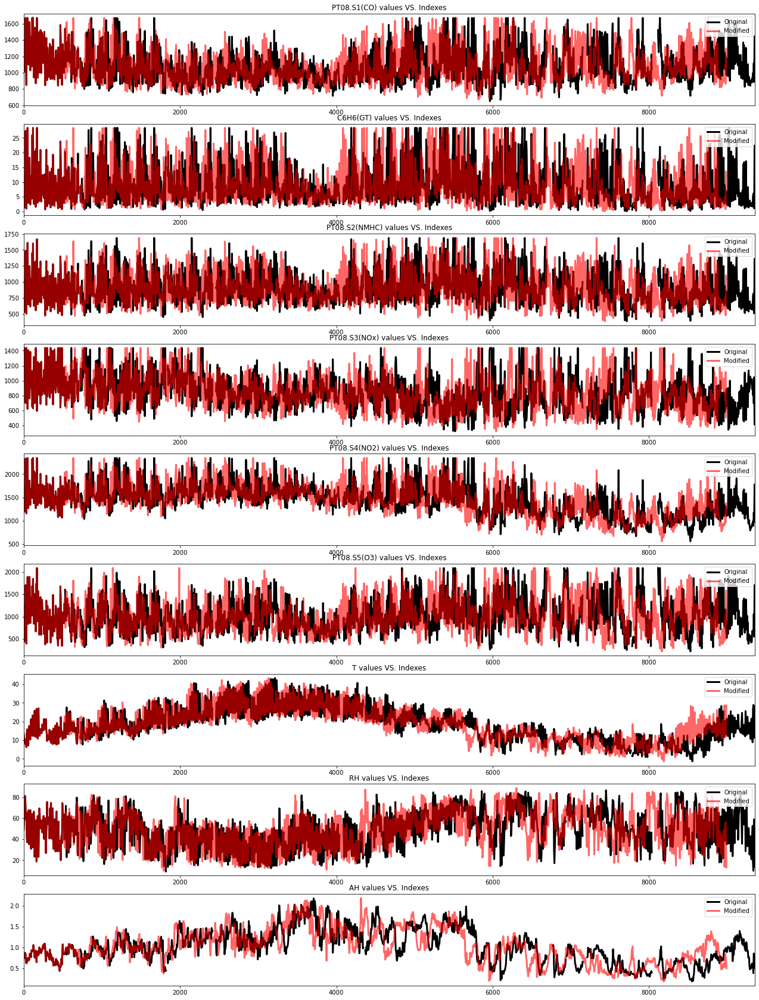

In [28]:
#Eliminating rows with NaN values

cdf_non_nan = cdf.dropna()
cdf_non_nan.reset_index(drop=True, inplace=True)
cdf_non_nan.info()
cdf_non_nan
plot_orig_modif_series(cdf, cdf_non_nan, cdf_non_nan.columns[2:])


______________________________________________________________________________
## Standard Deviation Method

For data that is too much skewed, we shouldn't use this method for removing outliers. This method is a great method for data that is normally distributed. So, we will use this method for just the columns with following indexes: (as their skewness values are low when calculted before.)

* column 9: PT08.S4(NO2)
* column 11: T
* column 12: RH
* column 13: AH

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   C6H6(GT)       8991 non-null   float64       

 5   PT08.S2(NMHC)  8991 non-null   float64       

 6   NOx(GT)        7718 non-null   float64       

 7   PT08.S3(NOx)   8991 non-null   float64       

 8   NO2(GT)        7715 non-null   float64       

 9   PT08.S4(NO2)   8991 non-null   float64       

 10  PT08.S5(O3)    8991 non-null   float64       

 11  T              8991 non-null   float64       

 12  RH             8991 non-null   float64       

 13  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

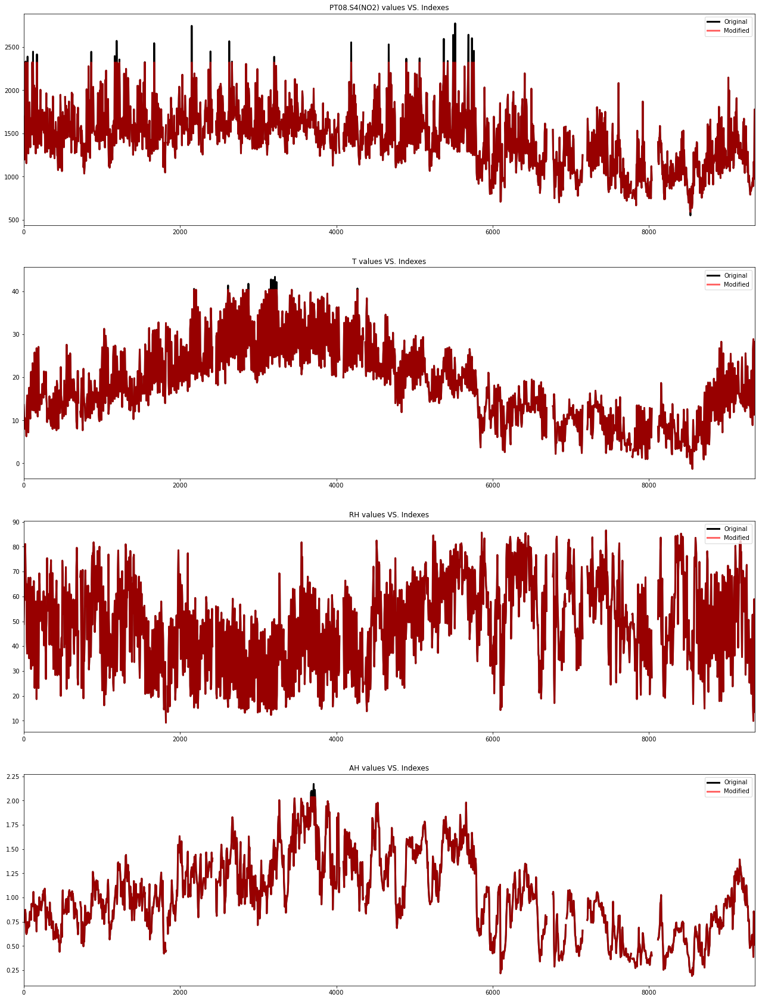

In [29]:

def remove_outliers_STD(df, columns, score=2):
    for c in columns:
        high_lim = df[c].mean() + score*df[c].std()
        low_lim = df[c].mean() - score*df[c].std()
#         print(f"High ({c}):", high_lim)
#         print(f"Low ({c}):", low_lim)
        df[c] = np.where(df[c] >= high_lim, high_lim, np.where(df[c] <= low_lim, low_lim, df[c]))
    df.info()
    
cdf_std = df.copy()
c = [9, 11, 12, 13] #selected columns
remove_outliers_STD(cdf_std, cdf_std.columns[c], score=2.5)
plot_orig_modif_series(df, cdf_std, cdf_std.columns[c])

As it is clear from the above plots, outliers are rare, thus having no statistical impact. And this proves that in the selected columns, we could remove and replace the worst outranged data, not many of the data!

---
---

# <center>Project - Iteration 2: ML-Based Data Preparation Techniques</center>

### <center>Topic: Air Quality Dataset</center>

From here on, we explore further onto our dataset. This section is the continuation of the previous one, so our dataset and context remains constant. We let the previous part remain because most of our useful functions are already predefined in the previous iteration.

<!-- OK. We make a copy of our original dataframe having outliers and missing data. Next we can treat them regarding the wanted parts below. -->
---

# Part 1 - Addressing previous part's issues

Nothing to be added to our project (iteration 1).

---

Before we start data scalings, we first load and show our original dataframe briefly.

In [30]:
# df2: dataframe for the 2nd iteration
df2 = df.copy() # making a copy of the original dataframe not to lose it
df2.info() # information of our dataframe

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7674 non-null   float64       

 3   PT08.S1(CO)    8991 non-null   float64       

 4   C6H6(GT)       8991 non-null   float64       

 5   PT08.S2(NMHC)  8991 non-null   float64       

 6   NOx(GT)        7718 non-null   float64       

 7   PT08.S3(NOx)   8991 non-null   float64       

 8   NO2(GT)        7715 non-null   float64       

 9   PT08.S4(NO2)   8991 non-null   float64       

 10  PT08.S5(O3)    8991 non-null   float64       

 11  T              8991 non-null   float64       

 12  RH             8991 non-null   float64       

 13  AH             8991 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

In [31]:
df2.head(5)

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


Using the functions already defined in the previous iteration, we can drop NaN values and remove the outliers quickly while we save those rows in variables to be used in our future prediction of the missing/outliers data.

In [32]:
# First, we replace the outliers with nan, then it'll be much easier to drop all the nans
# whether the original missing data or the outliers

remove_outliers_IQR(df2, df2.columns[2:], scale=1.48, mode="remove")
# when calling the above function, it replace the outliers of each feature with nan.

Outliers Ratio of CO(GT) was: %2.59

Outliers Ratio of PT08.S1(CO) was: %1.31

Outliers Ratio of C6H6(GT) was: %2.51

Outliers Ratio of PT08.S2(NMHC) was: %0.78

Outliers Ratio of NOx(GT) was: %4.83

Outliers Ratio of PT08.S3(NOx) was: %2.64

Outliers Ratio of NO2(GT) was: %1.19

Outliers Ratio of PT08.S4(NO2) was: %1.12

Outliers Ratio of PT08.S5(O3) was: %1.04

Outliers Ratio of T was: %0.04

Outliers Ratio of RH was: %0.0

Outliers Ratio of AH was: %0.04





<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         7432 non-null   float64       

 3   PT08.S1(CO)    8868 non-null   float64       

 4   C6H6(GT)       8756 non-null   float64       

 5   PT08.S2(NMHC)  8918 non-null   float64       

 6   NO

The above info table, shows the features with nan (missing data + outliers)

In [33]:
# let's store all the nan values and indexes:
nan = df2[df2.isna().any(axis=1)]
nan_indexes = nan.index.tolist()
df2 = df2.dropna() # cleaned

In [34]:
df2.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 6207 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           6207 non-null   datetime64[ns]

 1   Time           6207 non-null   object        

 2   CO(GT)         6207 non-null   float64       

 3   PT08.S1(CO)    6207 non-null   float64       

 4   C6H6(GT)       6207 non-null   float64       

 5   PT08.S2(NMHC)  6207 non-null   float64       

 6   NOx(GT)        6207 non-null   float64       

 7   PT08.S3(NOx)   6207 non-null   float64       

 8   NO2(GT)        6207 non-null   float64       

 9   PT08.S4(NO2)   6207 non-null   float64       

 10  PT08.S5(O3)    6207 non-null   float64       

 11  T              6207 non-null   float64       

 12  RH             6207 non-null   float64       

 13  AH             6207 non-null   float64       

dtypes: datetime64[ns](1), float64(12), object(1)

memory 

The above info table shows our dataframe is cleaned of all the missing data or outliers.

---

# Part 2 – Data scaling pre-assessment

In [35]:
# importing our scalers
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.preprocessing import FunctionTransformer

Our columns are all of the continuous type, and as for the `Date` and `Time` columns, they are to be considered as group indexes, but we prefer to leave them as columns, and we won't do any analysis on them. So, we won't be using Encoding techniques for any of our columns.
In the following, we plot to see the effect of different scaling techniques on our data.

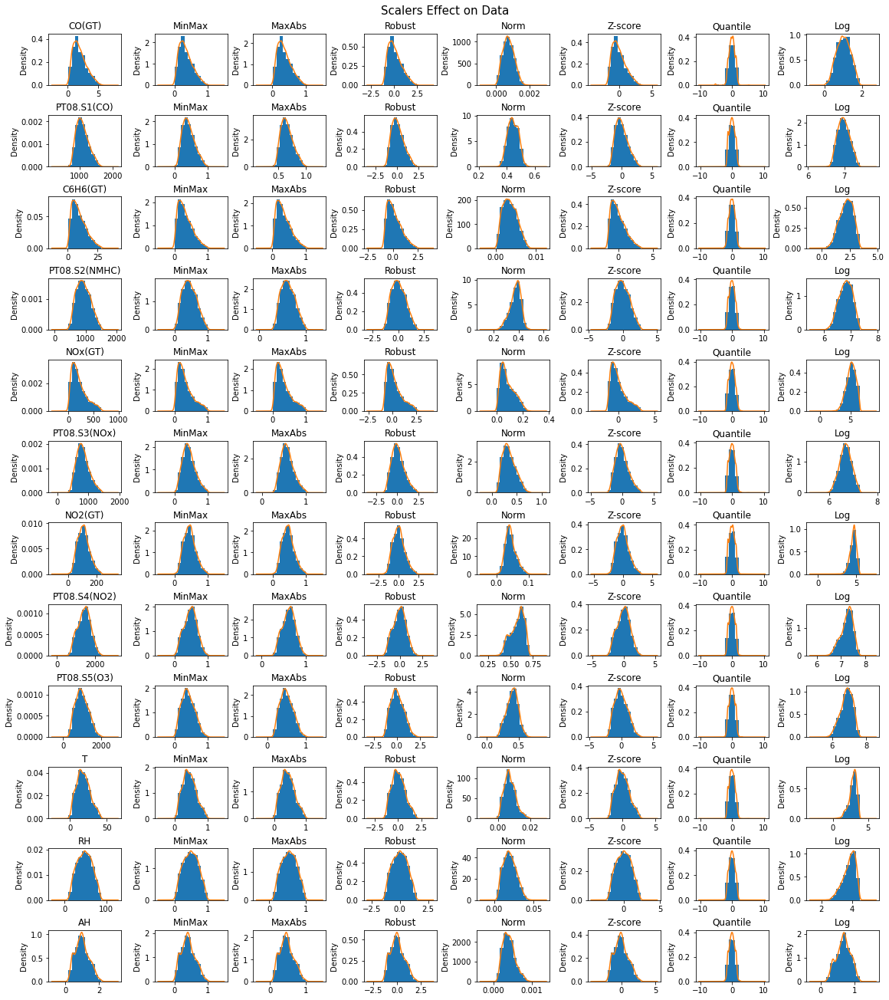

In [36]:
# 'Date', 'Time'
# 'CO(GT)','PT08.S1(CO)','C6H6(GT)','PT08.S2(NMHC)','NOx(GT)',
# 'PT08.S3(NOx)','NO2(GT)','PT08.S4(NO2)','PT08.S5(O3)','T','RH','AH'

def plot_hist_dens_for_scalers(df, columns, title, scalers, scaler_names):
    fig, axs = plt.subplots(len(columns),len(scalers)+1,figsize=(16,18),constrained_layout=True)
    fig.suptitle(title, fontsize=15)
    axs = axs.flatten()
    i = 0 
    for c in columns:
        df[c].hist(ax=axs[i], density=True) # normalizes the density
        df[c].plot.density(ax=axs[i], title=c)
        i+=1
        for j in range(len(scalers)):
            df_transformed = scalers[j].fit_transform(df) # transformed
            df_transformed = pd.DataFrame(df_transformed, index=df.index, columns=df.columns)
            
            df_transformed[c].hist(ax=axs[i], density=True, stacked=True) # normalizes the density
            df_transformed[c].plot.density(ax=axs[i], title=scaler_names[j])
            i+=1
            
# scaling on continuous features
cols = df2.columns[2:] # cont cols

scaler_names = ['MinMax', 'MaxAbs', 'Robust', 'Norm', 'Z-score', 'Quantile', 'Log']
scalers = [MinMaxScaler(), MaxAbsScaler(), RobustScaler(), Normalizer(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
           FunctionTransformer(np.log1p)]

plot_hist_dens_for_scalers(df2[cols], cols, 'Scalers Effect on Data', scalers, scaler_names)


we want to discuss the appropriate scaling techniques from above; in the iteration 1, we showed the `histograms`, `density` plots, `boxplots`, and `descriptive statistics`, and talked about the centrality and spread tendencies for each attribute. We saw our distributions were mostly skewed or multimodal. So the `~ 1.5 x IQR` method is good to handle the outliers, and we should use a median (not mean) whenever we want to replace (fill) some values with a central value.

Now, here, we detected the outliers together with the missing values, stored them in a variable, and removed them all before we apply the different scaling methods. So, the outliers are no longer considered an issue (at least, in this stage) to decide which scaling technique is acting better over the others.

We here can use **".describe()"** to see the centrality and spread measurements:

In [37]:
df2.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000,6207.000000
mean,1.948558,1091.946512,9.438376,926.744321,212.810375,823.587724,108.968423,1430.209602,1004.704205,18.239971,48.081924,0.996756
std,1.079427,182.392503,5.777472,221.348188,145.938054,202.248973,41.190810,328.580920,336.575909,8.933691,17.461041,0.403811
min,0.100000,667.000000,0.500000,440.000000,2.000000,360.000000,2.000000,601.000000,288.000000,-1.900000,9.200000,0.184700
25%,1.100000,953.000000,4.800000,755.000000,101.000000,676.000000,79.000000,1193.000000,751.000000,11.800000,34.300000,0.704400
50%,1.800000,1069.000000,8.300000,912.000000,174.000000,800.000000,107.000000,1443.000000,976.000000,17.600000,48.000000,0.968800
75%,2.600000,1210.000000,13.100000,1087.500000,292.500000,948.000000,135.000000,1662.000000,1236.500000,24.300000,61.500000,1.267500
max,5.500000,1664.000000,28.200000,1509.000000,662.000000,1426.000000,236.000000,2332.000000,2026.000000,42.800000,88.700000,2.139500


It is clear that there is high spread mainly for "PT08.S1(CO)", "PT08.S2(NMHC)", "NOx(GT)", "PT08.S3(NOx)", "PT08.S4(NO2)", and "PT08.S5(O3)".

______________________________________________________________________________
From all the previous figures, plots, and explanations we had in iteration 1, we can conclude the following results concerning our features:
* right skewed: `CO(GT)`, `PT08.S1(CO)`, `C6H6(GT)`, `NOx(GT)`, `PT08.S5(O3)`
* multimodal: `T`, `AH`
---

- **Min-Max** scaler:
    - values are shifted
    - ranging between two limits
    - shifts distribution to a smaller scale
    - not the best choice with severe skewness, e.g. for `CO(GT)`, ~`PT08.S1(CO)`, `C6H6(GT)`, `NOx(GT)` 
- **Max-abs** scaler:
    - doesn’t change the shape and center of a distribution
- **Robust** scaler:
    - removes the median
    - scales according to IQR
- **Quantile transform**:
    - maps to another probability distribution
    - makes a distribution normal (if output_distribution = 'normal')
    - performs well with bimodal and uniform data: e.g., for `T`, `AH`
- **Z-score**:
    - when your data are already normally distributed: ~`PT08.S2(NMHC)`, ~`PT08.S3(NOx)`, ~`NO2(GT)`, ~`PT08.S5(O3)`, ~`T`, `RH`
    
    - necessary for `linear regression`, `logistic regression`, and `linear discriminant analysis`, `PCA`, `SVM`, `LASSO` and `Ridge` regressions, etc.
    - values are centered around the mean with a unit std
    - mean gets 0
    - doesn’t scale to a special range
- **Log**:
    - when having a `power law` or `skewed` distribution then creates normality
    - captures relative changes and the magnitudes
    - positive space
    - works well with high-variance features
    - minimizes ***variance***
    - makes your data less skewed
- ***Conclusion***:
    - Because several of our features are skewed, ***Min-Max*** scaler is not an all-good scaler here.
    - ***Max-abs*** and ***Robust*** scalers are good, but if we want to utilize `linear regression` as one of our models, we then have to first ensure that all our features are normal and then standard. ***Quantile transform*** is good. For ***Z-score***, our distributions should be or get first normal. ***Log*** is good, but doesn't necessarily make distributions normal, and also, doesn't make them standard.
    - Depending on our ongoing models, we further choose the best scalers for our models.

# Part 3 – Handling missing data and outliers

***Baseline***:
   - Fill missing data with `ffill` or 'bfill'.
       - Our features are time series, and there is an dependency between rows; so we can use bfill/ffill methods or Interpolation techniques.
       - we don't use mean as it was already discussed that not all our distributions are normal.
   - Replace our outliers with `Quartile` max- and min- limits. In this way, we can handle our outliers of even for the non-normal distributions better. (Note that `Q1` and `Q3` are flexibly specific for each distribution having its own unique behavior)
<!--    - Scaler: `Quantile transform` -->

In [38]:
df_baseline = df.copy() # This dataframe now has NaNa and outliers.
                        # We treat those values with aforementioned methods.

In [39]:
df_baseline = df_baseline.fillna(method='ffill') # forward fill

# use upper and lower quartiles to replace outliers
cols = df_baseline.columns[2:]
remove_outliers_IQR(df_baseline, cols, scale=1.48, mode="replace") # mode: replace

Outliers Ratio of CO(GT) was: %4.54

Outliers Ratio of PT08.S1(CO) was: %1.15

Outliers Ratio of C6H6(GT) was: %2.6

Outliers Ratio of PT08.S2(NMHC) was: %0.73

Outliers Ratio of NOx(GT) was: %5.59

Outliers Ratio of PT08.S3(NOx) was: %2.64

Outliers Ratio of NO2(GT) was: %1.43

Outliers Ratio of PT08.S4(NO2) was: %1.06

Outliers Ratio of PT08.S5(O3) was: %0.79

Outliers Ratio of T was: %0.09

Outliers Ratio of RH was: %0.0

Outliers Ratio of AH was: %0.04





<class 'pandas.core.frame.DataFrame'>

RangeIndex: 9357 entries, 0 to 9356

Data columns (total 14 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         9357 non-null   float64       

 3   PT08.S1(CO)    9357 non-null   float64       

 4   C6H6(GT)       9357 non-null   float64       

 5   PT08.S2(NMHC)  9357 non-null   float64       

 6   NOx

Scaling our data for the baseline dataframe will be performed based on what scaling would the supervised model be using. So we define a function such that it can scale our baseline dataframe based on the scaler user wants, i.e., you give your intended scaler to it, it returns for you the scaled continuous baseline-dataframe.

In [40]:
df_bl_cont = df_baseline.drop(["Date", "Time"], axis=1) # continuous baseline df
                                                        # (without "Data" & "Time" columns)
# scaler options
# scalers = 
# [MinMaxScaler(),
# MaxAbsScaler(),
# RobustScaler(),
# StandardScaler(),
# FunctionTransformer(np.log1p),
# QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]

def scaled_df(df, scaler):
    # Let's scale X
    df_transformed = scaler.fit_transform(df)
    df_transformed = pd.DataFrame(df_transformed, index=df.index, columns=df.columns)
    return df_transformed


Before we move on to training based on the two supervised regression models, we import/define necessary libraries/variables.

In [41]:
# scaler libs are already imported in the previous task 
# import libs
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score

# Defining No-Scaling Transformer to be used in "for" loop together with other scalers.
from sklearn.preprocessing import FunctionTransformer
NoneScaler = FunctionTransformer(lambda x: x)

scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile', 'Log']
scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
           FunctionTransformer(np.log1p)]

# "df2" is already cleaned ready to be used for the supervised trainings
cont_cols = df2.columns[2:] # continuous column names
X_all = df2[cont_cols] # all continuous columns

In the following, we have defined a function such that it can train the models (Linear/KNN regressors) and report/plot their scores. Our scoring for the performance of the regressors is chosen as `R²` (R-Squared), which shows the goodness of fit.

In [42]:
def regress_target_method(target, method, nneighbor=3, plot=True): # target: can be each of the columns
                                                      # method: "Linear", "KNN"
                                                      # nneighbor: n_neighbors = 3, 5, ...
            
    scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile']
    scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]

    X = X_all.drop([target], axis=1) # input dataframe
    X_scaled = X.copy() # Copy edition (will be used for scaling the specific cols)
    # y is the output
    y = df2[target].to_numpy() # target data
    
    
    # regression method: "Linear", "KNN"
    if method == "Linear":
        model = LinearRegression()  
    else:
        model = KNeighborsRegressor(n_neighbors=nneighbor)
        
    
    scoring = 'r2' # Best possible score of r2 is 1.0
                   # R-Squared (R² or the coefficient of determination)
                   # R² shows the goodness of fit
    results = {}

    # Let's define the structure for rounds of crossvalidations
    # 5 (Fold) x 6 (repeat) = 30 estimates
    cv = RepeatedKFold(n_splits=5, n_repeats=6, random_state=1) # reproducible
    
    for i in range (len(scalers)):
        # Let's scale X
        X_scaled = scalers[i].fit_transform(X) # cont cols get scaled
        scores = cross_val_score(model, X_scaled, y, scoring=scoring, cv=cv, n_jobs=-1) # n_jobs: parallel
        results[scaler_names[i]] = [abs(m) for m in scores]

    return results
    
    # Now let's create our scores boxplots
#     if plot == True:
#         df_score = pd.DataFrame(results)
#         boxplot = df_score.boxplot() 
#         boxplot.set_ylabel('RootMSE')
#         if method == "Linear":
#             plt.suptitle(f'{method} Regression, target: {target}')
#         else:
#             plt.suptitle(f'{method} Regression (K={nneighbor}), target: {target}')
#         plt.show()

## LinearRegression

Here, we plot the `R²`-score boxplots of different scaling methods for the Linear regression, in which each of the columns is considered the target.

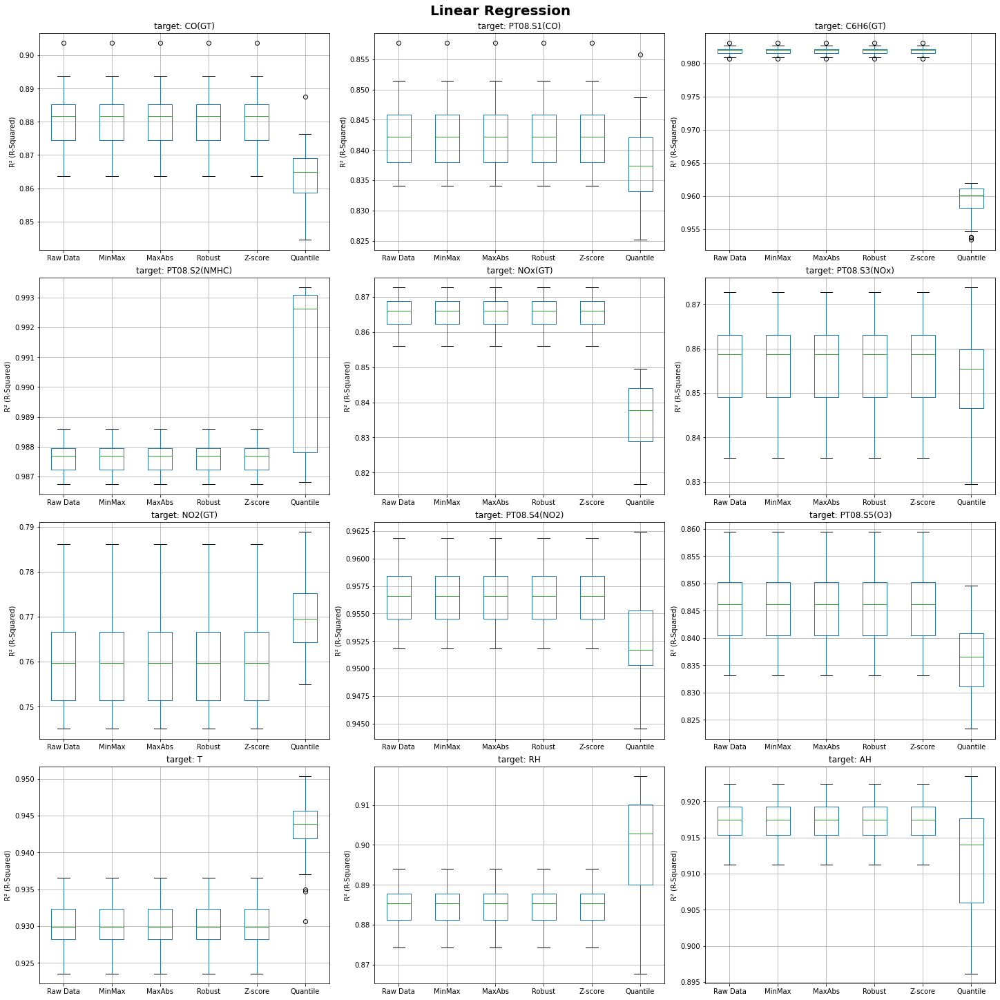

In [43]:
fig, axs = plt.subplots(4, 3, figsize=(20, 20), constrained_layout=True)
axs = axs.flatten()

i=0
for c in X_all.columns: # in each time, one column is the target
    results = regress_target_method(target=c, method="Linear") # call the regression function
    df_score = pd.DataFrame(results)
    boxplot = df_score.boxplot(ax=axs[i])
    boxplot.set_ylabel('R² (R-Squared)')
    boxplot.set_title(f'target: {c}')
    i+=1
plt.suptitle('Linear Regression', fontsize= 20, fontweight='bold')
# plt.tight_layout(h_pad=3)
plt.show()

- Some of the criteria: Skewness/Outlier/Distribution/Median


- Note: "For the Linear Regression, the performance difference between various scalers and the raw data may be nothing or minor."

***Best model combinations***

- `CO(GT)`: All the scalers (as well as the raw data) are good and similar, except for "Quantile Transform". They have the same Skewness/Outlier/Distribution/Median~0.882.


- `PT08.S1(CO)`: The same good performance for the scalers/raw data, except for "Quantile Transform". Median~0.842


- `C6H6(GT)`: Except for "Quantile Transform" which is less good, all the others are perfect and the same. Median~0.982


- `PT08.S2(NMHC)`: Although "Quantile Transform" has a perfect median, it has a spread distribution. The others are again the same. Median~0.9878


- `NOx(GT)`: "Quantile Transform" is less good. All the others are good and the same. Median~0.865


- `PT08.S3(NOx)`: "Quantile Transform" is less good: lower median, more spread, and lower IQR . All the others are good and the same. Median~0.858


- `NO2(GT)`: `Quantile Transform` is the best: higher median and less spread: Median~0.77


- `PT08.S4(NO2)`: "Quantile Transform" is less good: lower median, skewed and more spread. All the others are good and the same. Median~0.9563


- `PT08.S5(O3)`: "Quantile Transform" is less good: lower median. All the others are good and the same. Median~0.846


- `T`: `Quantile Transform` is the best although it has some outliers: Median~0.944


- `RH`: "Quantile Transform" is more spread but has better median. The others are the same, and we prefer to choose one of them because they are more stable and have a minute difference in median compared with Quantile.


- `AH`: Except for "Quantile Transform" which is less good (more spread, lower median, skewed), all the others are perfect and the same. Median~0.918


---
## KNN Regression

Here, we plot the `R²`-score boxplots of different scaling methods for the KNN regression, in which each of the columns is considered the target.

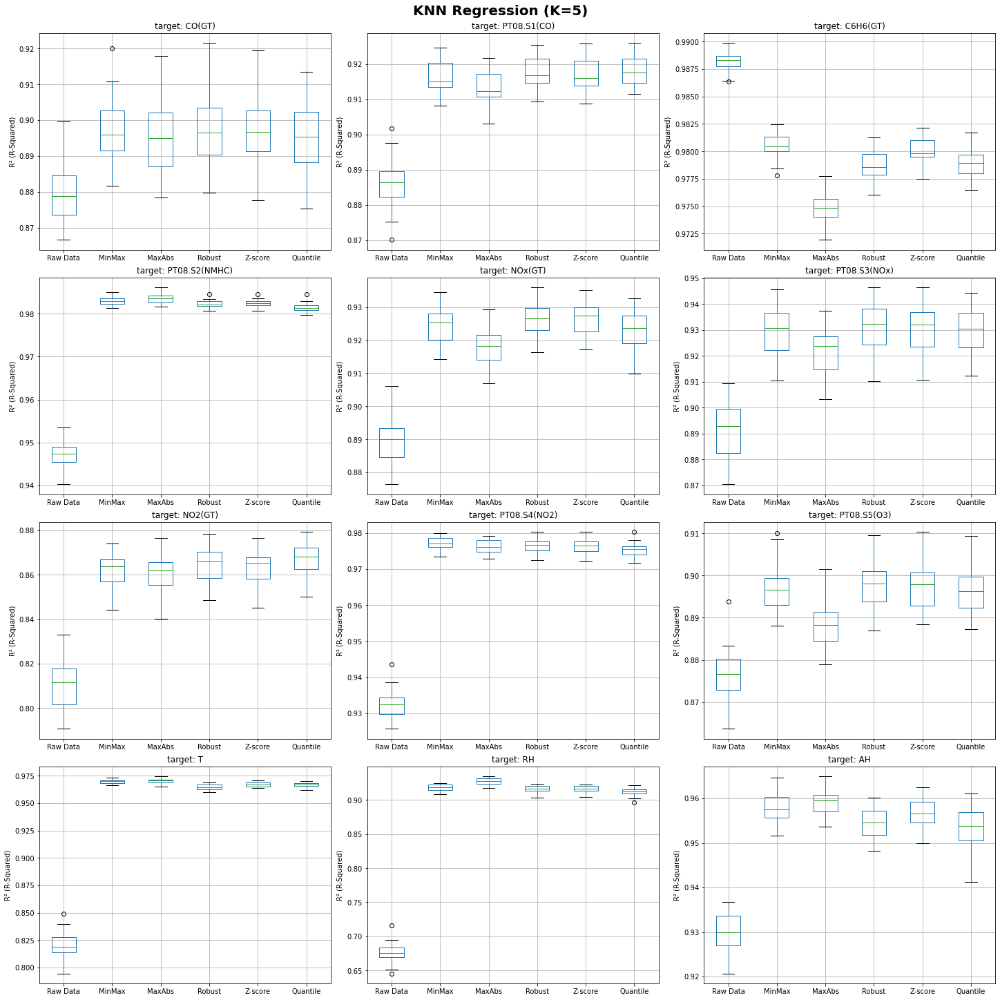

In [44]:
fig, axs = plt.subplots(4, 3, figsize=(20, 20), constrained_layout=True)
axs = axs.flatten()

i=0
K=5
for c in X_all.columns: # in each time, one column is the target
    results = regress_target_method(target=c, method="KNN", nneighbor=K) # call the regression function
    df_score = pd.DataFrame(results)
    boxplot = df_score.boxplot(ax=axs[i])
    boxplot.set_ylabel('R² (R-Squared)')
    boxplot.set_title(f'target: {c}')
    i+=1
plt.suptitle(f'KNN Regression (K={K})', fontsize= 20, fontweight='bold')
# plt.tight_layout(h_pad=3)
plt.show()

- Some of the criteria: Skewness/Outlier/Distribution/Median


- Note: "Despite the Linear Regression, in KNN Regression, the difference among various scalers and raw data is obvious."

***Best model combinations***

- `CO(GT)`: We choose `Robust` because has the highest median, and although spread, the spread is placed in high score zone. It also is not skewed and hasn't outliers. Median~0.897


- `PT08.S1(CO)`: We go for `Quantile Transform`: not skewed, low spread, high Median of ~0.918


- `C6H6(GT)`: Undoubtedly, the `Raw Data` itself has appeared as the best. Median~0.988


- `PT08.S2(NMHC)`: `MaxAbs`: Median~0.984


- `NOx(GT)`: `Z-score` compared with `Robust` has higher median, lower spread. Median~0.928


- `PT08.S3(NOx)`: `Robust` compared with "Z-score" is not skewed and has higher quantiles. Median~0.931


- `NO2(GT)`: `Quantile Transform` is the best (based on the aforementioned criteria). Median~0.869


- `PT08.S4(NO2)`: `MinMax` Median~0.978


- `PT08.S5(O3)`: `Z-score` has high median and has higher quantiles compared with "Robust". Median~0.898


- `T`: `MaxAbs` is the best. Median~0.970


- `RH`: `MaxAbs` is the best. Median~0.95


- `AH`: `MaxAbs` is the best (highest median, higher quantiles). Median~0.96
---

## Extracting Treated NaN Subset from the Baseline DataFrame

- `nan`: Subset dataframe consisted of rows having nan(s)
- `nan_indexes`: NaN row indexes
- `df_bl_cont`: continuous baseline dataframe

We know which indexes are relating to NaNs. We want to choose the zones of our baseline dataframe which has filled the nans already with some value. In this way, we can have an input data frame which will be used for the Predictor Function. We will predict the proper values for nans, and replace the nans with the forcasted values. As for the non-nan values, we just leave the unchanged. It should be deemed that in some row there might by any chance be several nans. So we use the `df_for_forcast` dataset to have first the nans filled, and then feed that to our predictor.

In [45]:
df_for_forcast = df_bl_cont.iloc[nan_indexes]
df_for_forcast

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
6,1.2,1185.0,3.6,690.0,62.00,1431.24,77.0,1333.0,733.0,11.3,56.8,0.7603
7,1.0,1136.0,3.3,672.0,62.00,1431.24,76.0,1333.0,730.0,10.7,60.0,0.7702
8,0.9,1094.0,2.3,609.0,45.00,1431.24,60.0,1276.0,620.0,10.7,59.7,0.7648
9,0.6,1010.0,1.7,561.0,45.00,1431.24,60.0,1235.0,501.0,10.3,60.2,0.7517
10,0.6,1011.0,1.3,527.0,21.00,1431.24,34.0,1197.0,445.0,10.1,60.5,0.7465
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,1.2,1122.0,6.0,811.0,181.00,641.00,92.0,1336.0,1122.0,16.2,71.2,1.3013
9202,0.5,883.0,1.3,530.0,63.00,997.00,46.0,1102.0,617.0,13.7,68.2,1.0611
9253,4.0,1531.0,23.6,1394.0,645.08,407.00,133.0,1860.0,1683.0,12.7,69.6,1.0206
9274,0.5,818.0,0.8,473.0,47.00,1257.00,41.0,898.0,323.0,13.7,48.8,0.7606


In [46]:
# We make a copy of `nan` as to be able to fill the nan values with predictions coming from supervised fit model.
forcasted = nan.copy()

In [47]:
forcasted

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
6,2004-03-11,00:00:00,1.2,1185.0,3.6,690.0,62.0,NaN,77.0,1333.0,733.0,11.3,56.8,0.7603
7,2004-03-11,01:00:00,1.0,1136.0,3.3,672.0,62.0,NaN,76.0,1333.0,730.0,10.7,60.0,0.7702
8,2004-03-11,02:00:00,0.9,1094.0,2.3,609.0,45.0,NaN,60.0,1276.0,620.0,10.7,59.7,0.7648
9,2004-03-11,03:00:00,0.6,1010.0,1.7,561.0,NaN,NaN,NaN,1235.0,501.0,10.3,60.2,0.7517
10,2004-03-11,04:00:00,NaN,1011.0,1.3,527.0,21.0,NaN,34.0,1197.0,445.0,10.1,60.5,0.7465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,2005-03-26,04:00:00,NaN,1122.0,6.0,811.0,181.0,641.0,92.0,1336.0,1122.0,16.2,71.2,1.3013
9202,2005-03-29,04:00:00,NaN,883.0,1.3,530.0,63.0,997.0,46.0,1102.0,617.0,13.7,68.2,1.0611
9253,2005-03-31,07:00:00,4.0,1531.0,23.6,1394.0,NaN,407.0,133.0,1860.0,1683.0,12.7,69.6,1.0206
9274,2005-04-01,04:00:00,NaN,818.0,0.8,473.0,47.0,1257.0,41.0,898.0,323.0,13.7,48.8,0.7606


The NaN values of the above table will be filled by the predicted (forcasted) values coming from the model. Then, this dataset will be concatenated with the all-clean dataset. So our final dataframe will be produced with fresh values, no nans, and less outliers (treated outliers).

In below, we create our scaler lists to be used for each of the columns based on our previously chosen and discussed best scalers. 

In [48]:
Linear_Scalers = [NoneScaler,
                 NoneScaler,
                 NoneScaler,
                 NoneScaler,
                 NoneScaler,
                 NoneScaler,
                 QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
                 NoneScaler,
                 NoneScaler,
                 QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
                 NoneScaler,
                 NoneScaler]

KNN_Scalers = [RobustScaler(),
              QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
              NoneScaler,
              MaxAbsScaler(),
              StandardScaler(), 
              RobustScaler(),
              QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal'),
              MinMaxScaler(),
              StandardScaler(),
              MaxAbsScaler(),
              MaxAbsScaler(),
              MaxAbsScaler()]

## Fill NaNs Using the decided Regressor + Data Scalers
## Predictor Function

There are 2 methods can be used in this prediction: Linear/KNN.

In [49]:
def predictor_regressor(method="KNN", nneighbor=5):

    if method == "Linear":
        scalers = Linear_Scalers # linear
        model = LinearRegression()
    else:
        scalers = KNN_Scalers # KNN
        model = KNeighborsRegressor(n_neighbors=nneighbor)

    X_all_to_pred = df_for_forcast # all columns
    X_all_clean = df2[df2.columns[2:]]

    i=0
    for c in X_all_to_pred.columns: # in each time, one column (c) is the target
        # -----------------------------------------------------------
        # not clean
        X_to_pred = X_all_to_pred.drop([c], axis=1) # input dataframe
        # y is the output
        y_base = X_all_to_pred[c].to_numpy() # target data
        # Let's scale X
        X_to_pred_scaled = scalers[i].fit_transform(X_to_pred) # cont cols get scaled
        # -----------------------------------------------------------
        # clean
        X_clean = X_all_clean.drop([c], axis=1)
        y_clean = X_all_clean[c].to_numpy()
        X_clean_scaled = scalers[i].fit_transform(X_clean)
        # -----------------------------------------------------------
        model.fit(X_clean_scaled, y_clean) # fit the model with clean data
        # -----------------------------------------------------------
        # Now let's predict the specific column in the chosen row
        y_pred = model.predict(X_to_pred_scaled)
        # -----------------------------------------------------------
        # we just replace the "NaN" values with the predicted ones:
        index_reset = forcasted.reset_index(drop=True).index.tolist()
        for r in index_reset:
            member = forcasted.iloc[r, i+2]
            if np.isnan(member):
                forcasted.iloc[r, i+2] = y_pred[r]
            else:
                pass
        # -----------------------------------------------------------
        i+=1
        # -----------------------------------------------------------
    # let's replace NaNs in original dataframe with the predicted ones
    result = pd.concat([df2, forcasted])
    result = result.sort_index(ascending=True)
    return result

# df_modif = df2.copy()
#     return df_modif.append(forcasted)

In [50]:
# we call the function above for two methods and save the outputs into two dataframes:
df_modif_linear = predictor_regressor(method="Linear")
df_modif_knn = predictor_regressor(method="KNN")

## Plot Linear-Based Modified DataFrame vs. Original DataFrame

we plot the dataframe modified by the linear-based regression above, vs. the baseline dataframe that contains filled values with simple methods (to see the enhancements in this transition clearly):


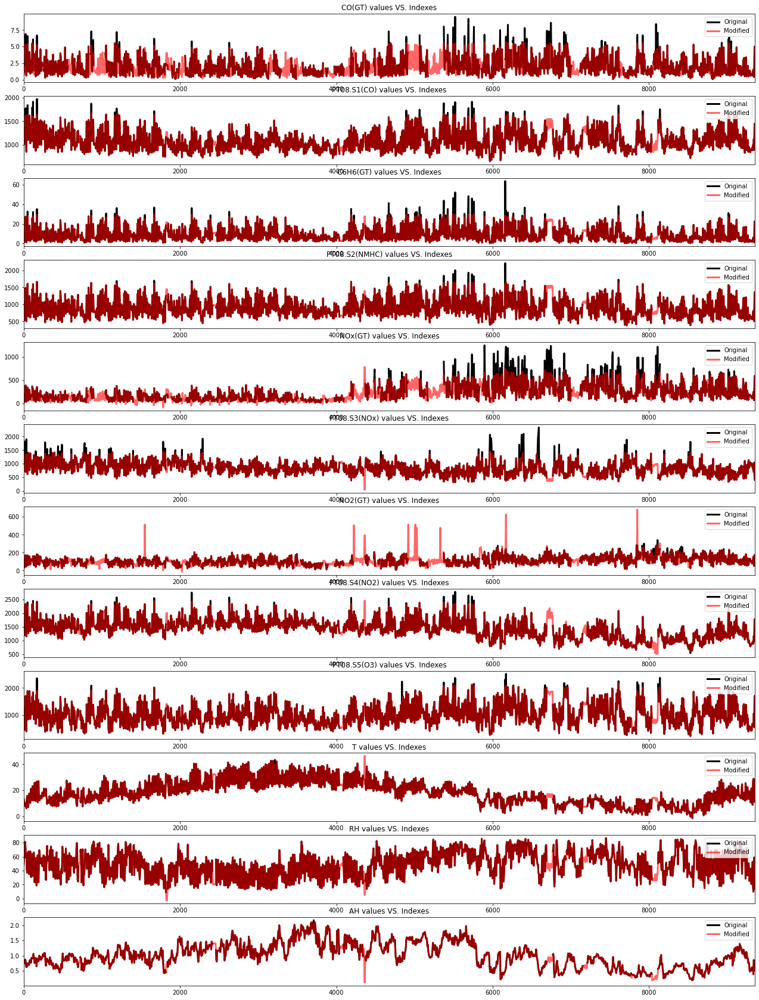

In [51]:
plot_orig_modif_series(original=df, modified=df_modif_linear, columns=df.columns[2:])


## Plot KNN-Based Regression Modified DataFrame vs. Original DataFrame

The modified dataframe obtained by the KNN model  vs. the original dataframe (having nans and outliers):

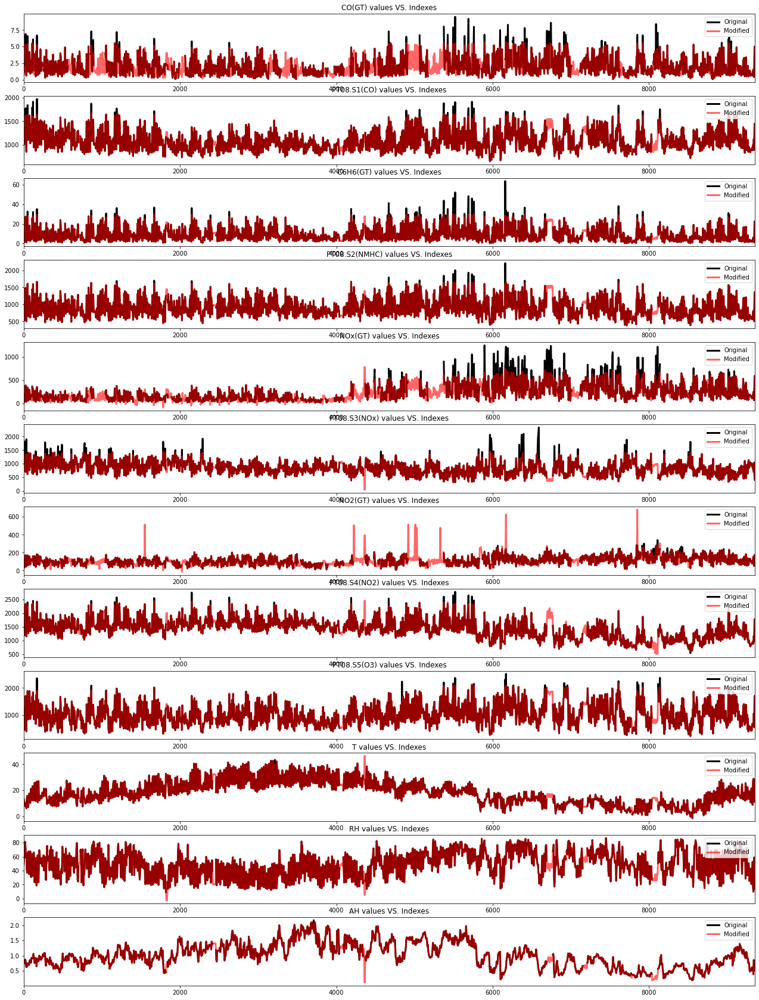

In [52]:
plot_orig_modif_series(original=df, modified=df_modif_knn, columns=df.columns[2:])


## Plot KNN-Based Regression Modified DataFrame vs. BaseLine DataFrame

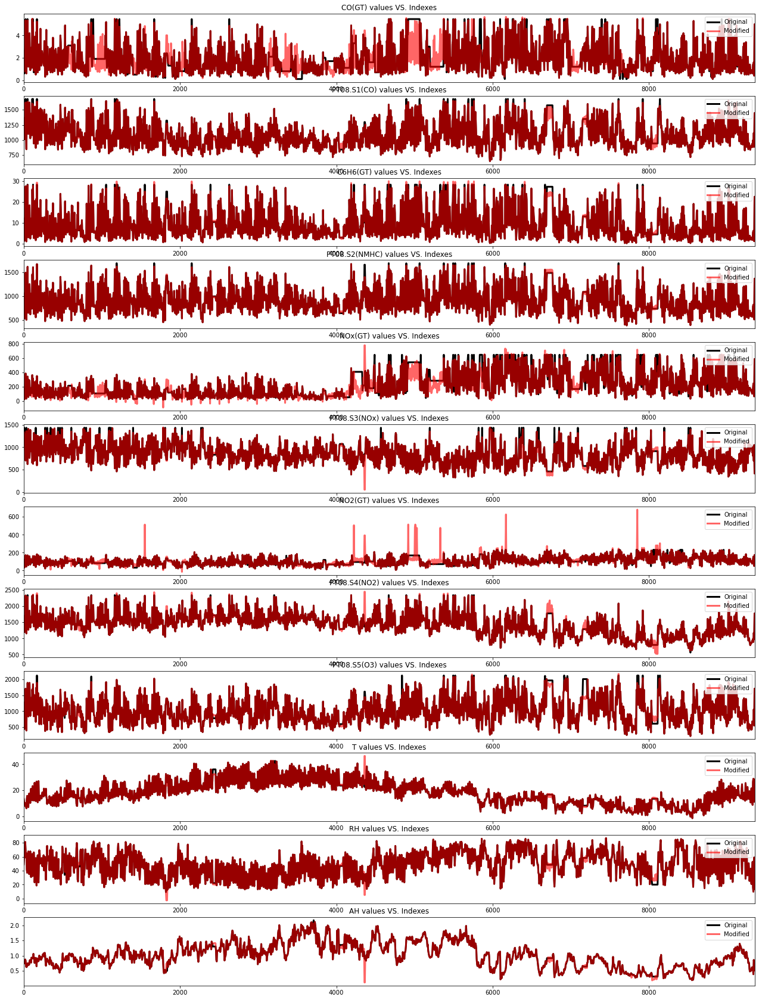

In [53]:
plot_orig_modif_series(original=df_baseline, modified=df_modif_knn, columns=df.columns[2:])

## BoxPlot Visualization of Different DataFrames

We plot boxplots of all of our full data frames to see them side-by-side:

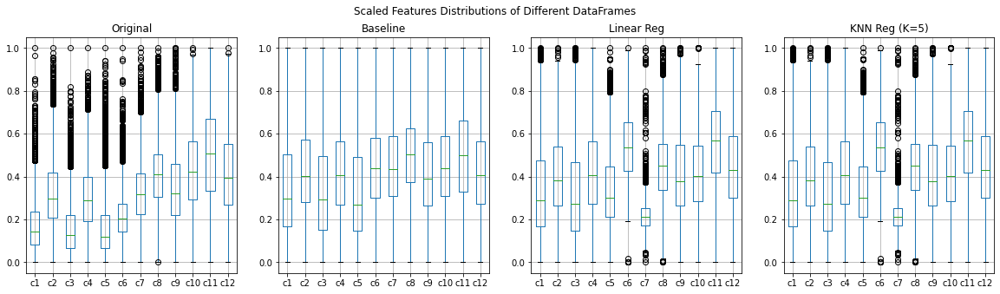

In [54]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs = axs.flatten()
# --------------------------------------------
cols = []
for i in range(1,13):
    cols = np.append(cols, f'c{i}')
cols
# --------------------------------------------
titles = ['Original', 'Baseline', 'Linear Reg', 'KNN Reg (K=5)']
i=0
dfs = [df, df_baseline, df_modif_linear, df_modif_knn]
for d in dfs:
    d = d.drop(["Date", "Time"], axis=1)
    d.columns = cols
    d = scaled_df(d, MinMaxScaler())
    boxplot = d.boxplot(ax=axs[i]) 
#     boxplot.set_ylim(0, 1)
#     boxplot.set_ylabel('')
    boxplot.set_title(f'{titles[i]}')
    i+=1
plt.suptitle(f'Scaled Features Distributions of Different DataFrames')
plt.show()
# --------------------------------------------



To discuss the above comparison, four dataframes of `df`, `df_baseline`, `df_modif_linear`, and `df_modif_knn` are scaled using `MinMaxScaler()` and plotted. c1 to c12 are the continuous columns of the dataframe. As we can see, the outliers are replaced by the quantile limits in the baseline dataframe and because nan values have got some value, the box plots in baseline are more spread and have got larger inter quantile ranges. In the other dataframes, i.e. linear and knn regressors, most of the outliers have got removed, and the other outliers are generated because for predection, we have to give the model other feature values in a row, and if we have several nan values in a row, their values are got filled with the baseline model, which is not necessarily accurate. So this inaccuracy that we give to the regressor predictor to predict one on the nan values as target, results in inaccurate output. For the baseline, it might be better to try other approaches (median, interpolation techniques, etc) for filling the nan values, and then see what would the unwanted generated outliers be like. It should be deem that some of the outliers in the regressor models may be really outliers that our models could have predicted them correctly! For the parts that there hasn't been nan values due to missing data (not outliers), our regressor models could have successful remove the outliers as this can be seen in the time series plots.

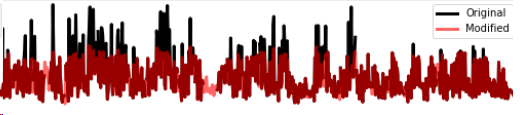

Then, we choose the dataset of the `df_modif_knn` for the next part.

---
# Part 4 – Supervised Learning Problem design

We use the `df_modif_knn` dataframe and make a copy of it such that we start with `df_4`  as our dataframe in this part.

In [55]:
df_4 = df_modif_knn.copy() # df_4: df part 4

## Correlation Matrix
To see what column we should determine as a goal to be achieved, we plot the correlation matrix.

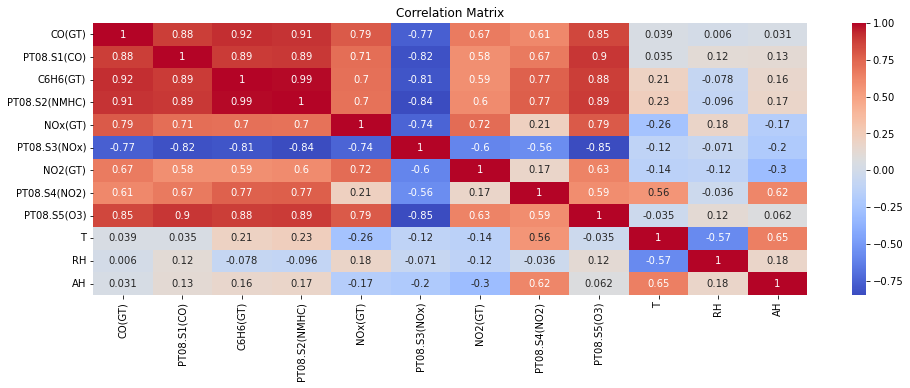

In [56]:
#Plotting correlation matrix
import seaborn as sns

plt.figure(figsize=(16,5))
cols = df_4.columns[2:]
sns.heatmap(df_4[cols].corr(), annot=True, cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

OK, the diagonal shows the correlation between a feature and itself, which is obvious to be 1.

We should eliminate the `C6H6(GT)` for being a redundant sensor because the C6HC molecule is a Non-Methanic Hydrocarbon (NMHC), so the correlation between `C6H6(GT)` and `PT08.S2(NMHC)` sensors is exact.

In [57]:
df_4.drop('C6H6(GT)', axis=1, inplace=True)

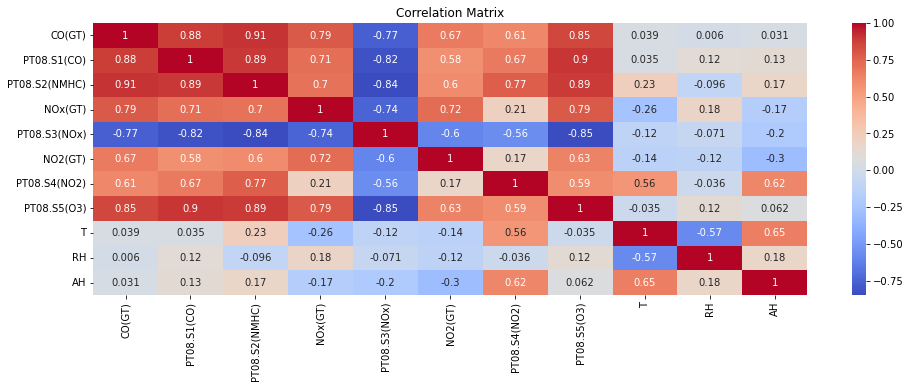

In [58]:
plt.figure(figsize=(16,5))
cols = df_4.columns[2:]
sns.heatmap(df_4[cols].corr(), annot=True, cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Baseline Regression Model

We aim to create a KNN beased-line Regression Model of the `PT08.S1` sensor because there is a comparatively solid correlation between this and other features. Also, it is important for us to predict the concentration of Carbon Monoxide (`CO`), which can cause headache, dizziness, weakness, nausea, vomiting, chest pain, and confusion, loss of consciousness and death, that's why this gas concentration is more preferable to be known/predicted because this gas is by far more dangerous than the other gases studied in this survey.

In previous part, we discussed that in KNN Regression model, when the target is `PT08.S1(CO)`, the best Scaler technique to be used is `Quantile Transform`. Our dataframe is `df_4`.

In [59]:
def knn_reg_CO_score(df, columns,
              scalers = 
              [NoneScaler,
              QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')],
              scaler_names = ['Raw Data', 'Quantile'],
              K=5, explain="", model = KNeighborsRegressor(n_neighbors=5)):
    
    # -------------------------------------------------------------------------------------------
    cont_cols = columns # continuous column names
    X_all = df[cont_cols] # all continuous columns
    # -------------------------------------------------------------------------------------------
    target = "PT08.S1(CO)"
    
    X = X_all.drop([target], axis=1) # input dataframe
    X_scaled = X.copy() # Copy edition (will be used for scaling the specific cols)
    # y is the output
    y = df_4[target].to_numpy() # target data
    # -------------------------------------------------------------------------------------------
    # regression method: "KNN"
    # K = 5
    # model = KNeighborsRegressor(n_neighbors=K)
    scoring = 'r2' # Best possible score of r2 is 1.0
               # R-Squared (R² or the coefficient of determination)
               # R² shows the goodness of fit
    results = {}
    # -------------------------------------------------------------------------------------------
    # Let's define the structure for rounds of crossvalidations
    # 5 (Fold) x 6 (repeat) = 30 estimates
    cv = RepeatedKFold(n_splits=5, n_repeats=6, random_state=1) # reproducible
    # -------------------------------------------------------------------------------------------
    for i in range (len(scalers)):
        # Let's scale X
        X_scaled = scalers[i].fit_transform(X) # cont cols get scaled
        scores = cross_val_score(model, X_scaled, y, scoring=scoring, cv=cv, n_jobs=-1) # n_jobs: parallel
        results[scaler_names[i]] = [abs(m) for m in scores]
    # -------------------------------------------------------------------------------------------
    # Now let's create our score boxplots
    df_score = pd.DataFrame(results)
    boxplot = df_score.boxplot() 
    boxplot.set_ylabel('R² (R-Squared)')
    plt.suptitle(f'KNN Regression (K={K}), target: {target}, {explain}', fontsize= 20, fontweight='bold')
    plt.show()

When the target is `PT08.S1(CO)`, the best Scaler technique as long as our dataframe is `df_4` is predicted to be `Quantile Transform`. In below, we can see this!

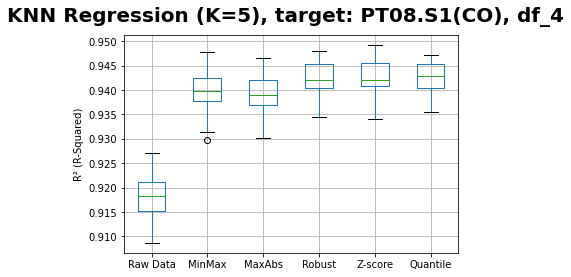

In [60]:
scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile']
scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]

knn_reg_CO_score(df_4, df_4.columns[2:], scalers, scaler_names, K=5, explain="df_4")
# knn_reg_CO_score(df_4, df_4.columns[2:], K=5, explain="df_4")

## Enhancing Quality of Results

We will apply a `remove_outliers_IQR` function to our dataset with the `mode="replace"` as to modify the parts that the KNN regressor model had predicted highly sudden peaks. In this way, we both benefit from the advantages of having more real changing values for the missing data part and also having modified and treated outliers for the outlier part.

<!-- <img src=" " /> -->

<img src=" 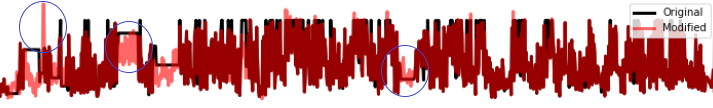 " />

In [61]:
df_4_outlier_edited = df_4.copy()
cols = df_4_outlier_edited.columns[2:]
remove_outliers_IQR(df_4_outlier_edited, cols, scale=1.5, mode="replace")
# KNN df_4_outlier_edited DataFrame vs. BaseLine DataFrame
# plot_orig_modif_series(original=df_baseline, modified=df_4_outlier_edited, columns=cols)

Outliers Ratio of CO(GT) was: %0.94

Outliers Ratio of PT08.S1(CO) was: %0.07

Outliers Ratio of PT08.S2(NMHC) was: %0.0

Outliers Ratio of NOx(GT) was: %1.8

Outliers Ratio of PT08.S3(NOx) was: %0.1

Outliers Ratio of NO2(GT) was: %2.22

Outliers Ratio of PT08.S4(NO2) was: %0.77

Outliers Ratio of PT08.S5(O3) was: %0.14

Outliers Ratio of T was: %0.09

Outliers Ratio of RH was: %0.0

Outliers Ratio of AH was: %0.0





<class 'pandas.core.frame.DataFrame'>

Int64Index: 9357 entries, 0 to 9356

Data columns (total 13 columns):

 #   Column         Non-Null Count  Dtype         

---  ------         --------------  -----         

 0   Date           9357 non-null   datetime64[ns]

 1   Time           9357 non-null   object        

 2   CO(GT)         9357 non-null   float64       

 3   PT08.S1(CO)    9357 non-null   float64       

 4   PT08.S2(NMHC)  9357 non-null   float64       

 5   NOx(GT)        9357 non-null   float64       

 6   PT08.S3(NOx)   9357 non-null   float64       

---
Because we treated the outliers of `df_4` in above, our dataframe here is called `df_4_outlier_edited`. As the outliers in some parts the knn model had predicted may be inaccurate, we assume other scaling techniques here to see which will have the better score.

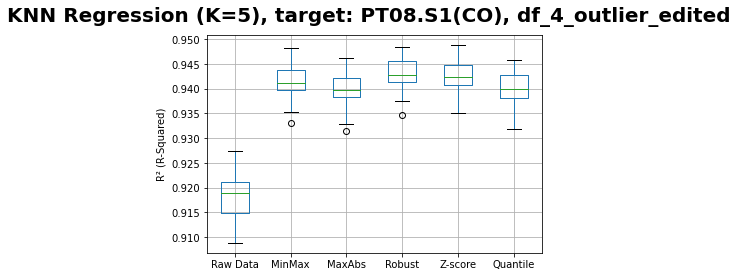

In [62]:
# df: df_4_outlier_edited
scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile']
scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]
    
knn_reg_CO_score(df_4_outlier_edited, cols,
                  scalers, scaler_names, K=5, explain="df_4_outlier_edited")

So the best model after editing further the outlier is KNN Regressor combined with `Robust` Scaler. So the enhancing has occured from (Quantile, Non Edited Outlier) towards (Robust, Edited Outlier):
- lower limit:
    - 0.935 => 0.937
- Q1:
    - 0.940 => 0.942
- Median:
    - 0.942 => 0.943
- Q3:
    - 0.945 => 0.946
- upper limit:
    - 0.947 => 0.948

---
## Other Approaches

We will not use `Dimensionality Reduction` because it is used when the transformation of data from a high-dimensional space into a low-dimensional space is needed. The number of our features is just 11.

### Data Discretization

Regarding the fact that `Data Discretization` refers to methods of converting a huge number of data values into smaller ones so that the evaluation and management of data ***becomes easy***, we try this method. Our data instances are `9357`, we can discretize and transform our huge continuous variables into a discrete form.

#### Strategy: Uniform

***Equal-width*** for bins

In [63]:
from sklearn.preprocessing import KBinsDiscretizer

df_disct_1 = df_4_outlier_edited.copy()
cols = df_disct_1.columns[2:]
discretizer = KBinsDiscretizer(n_bins=25, encode='ordinal', strategy='uniform')
X_transformed = discretizer.fit_transform(df_disct_1[cols])
df_disct_1 = pd.DataFrame(X_transformed, index=df_disct_1.index, columns=cols)
df_disct_1

,CO(GT),PT08.S1(CO),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,11.0,17.0,12.0,9.0,17.0,13.0,15.0,13.0,8.0,14.0,7.0
1,8.0,15.0,11.0,7.0,19.0,10.0,13.0,9.0,8.0,13.0,7.0
2,9.0,18.0,10.0,7.0,19.0,13.0,13.0,11.0,7.0,15.0,7.0
3,9.0,17.0,10.0,9.0,18.0,14.0,14.0,12.0,7.0,17.0,8.0
4,7.0,15.0,8.0,7.0,20.0,13.0,13.0,11.0,7.0,17.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...
9352,14.0,16.0,13.0,19.0,7.0,21.0,11.0,19.0,13.0,8.0,7.0
9353,10.0,12.0,12.0,15.0,8.0,20.0,9.0,13.0,14.0,7.0,7.0
9354,10.0,11.0,13.0,13.0,8.0,19.0,9.0,11.0,16.0,5.0,6.0
9355,9.0,8.0,11.0,11.0,10.0,17.0,6.0,7.0,16.0,4.0,4.0


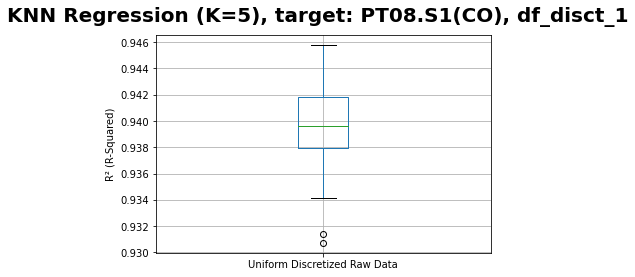

In [64]:
scaler_names = ['Uniform Discretized Raw Data']
scalers = [NoneScaler]
knn_reg_CO_score(df_disct_1, cols, scalers, scaler_names, K=5, explain="df_disct_1")

When we changed the `n_bins` from 10 to 25, we obviously saw that the performance/score of our model is just increasing. It is really a perfect technique for our dataset because we can quickly run the model and get the same or even the better results!

---

#### Strategy: Quantile

All bins in each feature will have ***the same number of points***.

In [65]:
# quantile: All bins in each feature have the same number of points.

df_disct_2 = df_4_outlier_edited.copy()
cols = df_disct_2.columns[2:]
bins=22
discretizer = KBinsDiscretizer(n_bins=bins, encode='ordinal', strategy='quantile')
X_transformed = discretizer.fit_transform(df_disct_2[cols])
df_disct_2 = pd.DataFrame(X_transformed, index=df_disct_2.index, columns=cols)
df_disct_2

,CO(GT),PT08.S1(CO),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,15.0,18.0,14.0,10.0,18.0,12.0,16.0,16.0,7.0,10.0,6.0
1,12.0,17.0,12.0,6.0,20.0,8.0,13.0,11.0,6.0,10.0,5.0
2,14.0,19.0,11.0,8.0,19.0,12.0,13.0,13.0,5.0,13.0,5.0
3,14.0,19.0,12.0,10.0,19.0,14.0,14.0,15.0,4.0,15.0,6.0
4,10.0,17.0,8.0,8.0,20.0,12.0,11.0,13.0,5.0,15.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...
9352,17.0,18.0,16.0,19.0,2.0,20.0,8.0,20.0,14.0,3.0,6.0
9353,15.0,14.0,14.0,17.0,4.0,20.0,6.0,16.0,16.0,1.0,5.0
9354,15.0,13.0,15.0,15.0,3.0,19.0,5.0,13.0,18.0,0.0,4.0
9355,13.0,8.0,12.0,13.0,7.0,18.0,2.0,6.0,19.0,0.0,2.0


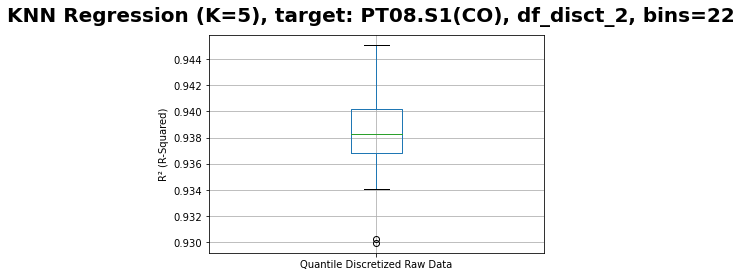

In [66]:
scaler_names = ['Quantile Discretized Raw Data']
scalers = [NoneScaler]
knn_reg_CO_score(df_disct_2, cols, scalers, scaler_names, K=5, explain="df_disct_2, bins=22")

The result is so good, and this approach accelerates the running time.

---
### Grid Searching Hyperparameters

Let's use the strategy of **grid searching** the most important **hyperparameters** for our KNN model. We use `GridSearchCV` module from sklearn.

In [67]:
df_grid = df_4_outlier_edited.copy()

cont_cols = df_grid.columns[2:] # continuous columns
X = df_grid[cont_cols] # all input dataframe
# y is the output
y = df_grid['PT08.S1(CO)'].to_numpy() # all target data 
# --------------------------------------------------------
from sklearn.model_selection import GridSearchCV
# --------------------------------------------------------
scaler_name = 'Robust'
scaler = RobustScaler()
# --------------------------------------------------------
model = KNeighborsRegressor()
# --------------------------------------------------------
n_neighbors = range(1, 20, 2) # Number of neighbors
weights = ['uniform', 'distance'] # Weight function used in prediction
metric = ['euclidean', 'manhattan', 'minkowski'] # Metric to use for distance computation
# define our search grid
grid = dict(n_neighbors=n_neighbors, weights=weights, metric=metric)
# --------------------------------------------------------
# rounds of crossvalidations (5 Folds)
cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1) # reproducible
# --------------------------------------------------------
# Let's scale X
X_scaled = scaler.fit_transform(X) # cont cols got scaled
searcher = GridSearchCV(estimator=model, param_grid=grid, scoring='r2', cv=cv, n_jobs=-1) # n_jobs: parallel
searcher.fit(X_scaled, y)

print("The best params are :", searcher.best_params_)
print("The best score is   :", searcher.best_score_)

The best params are : {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}

The best score is   : 0.9837229234979391


It clearly and hopefully confirms that we have been using a proper value for Number of neighbors (`n_neighbors`), which was chosen as 5. In the following, we apply the results of our grid searching to our model to see the enhancements:

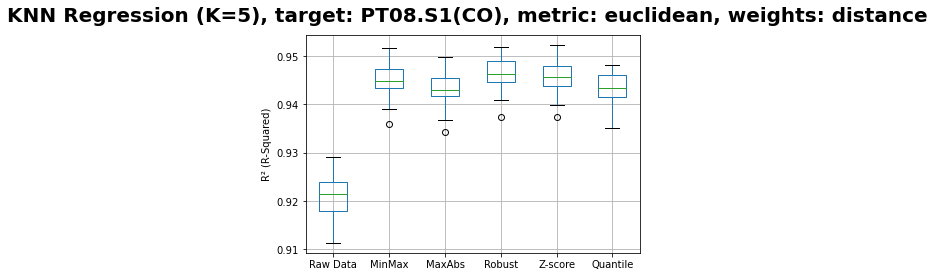

In [68]:
scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile']
scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]
# ----------------------------------------------------------------------------------------------
cols = df_grid.columns[2:]
# We call our knn function to see the outcome scores with the configuration obtained by the above Grid Searching
knn_reg_CO_score(df_grid, cols, scalers, scaler_names, K=5,
              explain="metric: euclidean, weights: distance",
              model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean'))


So the best model after applying the tuned hyperparameters for KNN Regressor is as the above plot. Fortunately, we can see an enhancement from (Robust, Edited Outlier, K=5, metric='minkowski', weights='uniform') towards (Robust, Edited Outlier, K=5, metric='euclidean', weights='distance'):
- ***lower limit***:
    - 0.937 => ***0.941***
- ***Q1***:
    - 0.942 => ***0.944***
- ***Median***:
    - 0.943 => ***0.945***
- ***Q3***:
    - 0.946 => ***0.949***
- ***upper limit***:
    - 0.948 => ***0.952***

---
# Feature Selection Using Correlation Matrix

This process calculates the correlations of all the features with the target feature. Based on those correlation values, features are chosen. For this project, a threshold of 0.2 was chosen. If the correlation of a feature is over 0.2 with the target, that feature is chosen for the regression.

In [69]:
columns = df_grid.columns[2:]
# dataframe
df_filter_cor_mat = df_grid[columns]

cor = df_filter_cor_mat.corr() # defining correlation matrix
cor_target = abs(cor["PT08.S1(CO)"])
relevant_features = cor_target[cor_target > 0.2] # this 0.2 can be changed
relevant_features.index

Index(['CO(GT)', 'PT08.S1(CO)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)',
       'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)'],
      dtype='object')

The above columns should be remained to be used for our modellig.

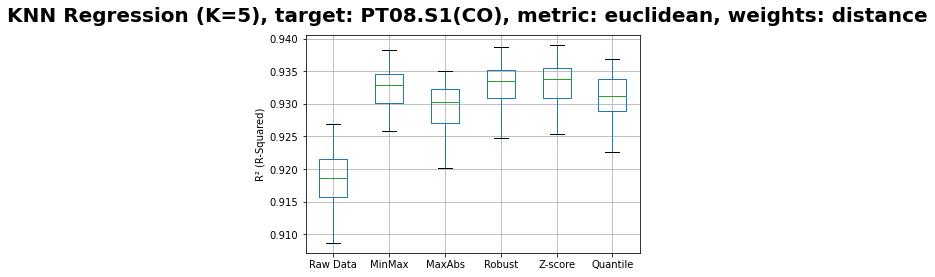

In [70]:
scaler_names = ['Raw Data', 'MinMax', 'MaxAbs', 'Robust', 'Z-score', 'Quantile']
scalers = [NoneScaler, MinMaxScaler(), MaxAbsScaler(), RobustScaler(), StandardScaler(),
           QuantileTransformer(n_quantiles=10, random_state=0, output_distribution='normal')]
# ----------------------------------------------------------------------------------------------
cols = ['CO(GT)', 'PT08.S1(CO)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)',
       'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
# We call our knn function to see the outcome score with these columns
knn_reg_CO_score(df_filter_cor_mat, cols, scalers, scaler_names, K=5,
              explain="metric: euclidean, weights: distance",
              model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean'))


The importance of this method is that we can significantly reduce less-correlated columns with the target. The outcome result also can be improved by tuning the parameters.

---

# <center>The Fortunate End</center>